# Analysis of simulated data

### Import dependencies

In [1]:
import matplotlib as mpl  
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np
import math
import importlib
import seaborn as sns
from collections import defaultdict
import sys
import importlib
from anndata import AnnData
import scanpy as sc
from statsmodels.stats.multitest import multipletests
import json
import os
from os.path import join

#sys.path.append('/Users/matthewbernstein/Development/spatialcorr-sim')
sys.path.append('/Users/matthewbernstein/Development/spatialcorr/')

#from simulate_spatial import simulate_data
#from simulate_spatial import normalize_deviance_residuals as ndr
import spatialcorr

DATA_ROOT = '/Users/matthewbernstein/Development/spatialcorr_dev/simulation_study'

sns.set_palette("Set2")

### Utility functions

In [2]:
def build_adata_from_sim_dataframe(df, g1='dino_gene_1', g2='dino_gene_2'):
    return AnnData(
        X=np.array([
            df[g1], 
            df[g2]]
        ).T,
        obs=df,
        var=pd.DataFrame(
            index=['Gene 1', 'Gene 2'],
            data=['Gene 1', 'Gene 2']
        )
    )

## Calculate statistics from experimental data

In [4]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

adata_real = sc.datasets.visium_sge(sample_id="V1_Breast_Cancer_Block_A_Section_1")
adata_real.X = adata_real.X.todense()
adata_real.obs['total_UMI_count'] = np.sum(adata_real.X, axis=1)
sc.pp.filter_cells(adata_real, min_counts=5000)
sc.pp.filter_cells(adata_real, max_counts=35000)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [5]:
n_spots_umi_gt_1 = np.sum((adata_real.X > 0).astype(int), axis=0)
frac_spots_umi_gt_1 = np.sum((adata_real.X > 0).astype(int), axis=0) / adata_real.X.shape[0]
mean_umis = np.mean(adata_real.X, axis=0)
variance_umis = np.var(adata_real.X, axis=0)
median_umis = np.median(adata_real.X, axis=0)
cv_umis = np.sqrt(variance_umis) / mean_umis
gene_stats_df = pd.DataFrame(
    data={
        'Mean UMI count': mean_umis,
        'Median UMI count': median_umis,
        'Variance UMI count': variance_umis,
        'Coefficient of variation UMI': cv_umis,
        'Number of spots w/ >1 UMI': n_spots_umi_gt_1,
        'Fraction of spots w/ >1 UMI':frac_spots_umi_gt_1
    },
    index=adata_real.var.index
)
gene_stats_df

/opt/anaconda3/envs/r-4.0/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


,Mean UMI count,Median UMI count,Variance UMI count,Coefficient of variation UMI,Number of spots w/ >1 UMI,Fraction of spots w/ >1 UMI
MIR1302-2HG,0.000000,0.0,0.000000,NaN,0,0.000000
FAM138A,0.000000,0.0,0.000000,NaN,0,0.000000
OR4F5,0.000000,0.0,0.000000,NaN,0,0.000000
AL627309.1,0.026459,0.0,0.027210,6.234344,71,0.025734
AL627309.3,0.000000,0.0,0.000000,NaN,0,0.000000
...,...,...,...,...,...,...
AC141272.1,0.000000,0.0,0.000000,NaN,0,0.000000
AC023491.2,0.000000,0.0,0.000000,NaN,0,0.000000
AC007325.1,0.000000,0.0,0.000000,NaN,0,0.000000
AC007325.4,0.279449,0.0,0.299209,1.957423,650,0.235593


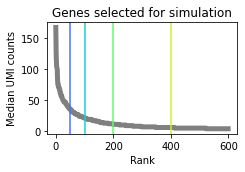

In [6]:
gene_stats_df_sort = gene_stats_df.sort_values('Median UMI count', axis=0, ascending=False)

fig, ax = plt.subplots(
    1,
    1,
    figsize = (3.5,2.5)
)
plt.plot(
    np.arange(0,600),
    gene_stats_df_sort.iloc[:600]['Median UMI count'],
    color='grey',
    lw=5
)
#plt.axvline(x=1, ymax=0.96, c='red')   # S100A13 Index
#plt.axvline(x=50, ymax=0.23, c='red')   # HSP90AB1 Index
#plt.axvline(x=100, ymax=0.16, c='red')   # RPS10 Index
#plt.axvline(x=200, ymax=0.10, c='red')   # S100A13 Index
turbo_pal = sns.color_palette("turbo")
plt.axvline(x=50, c=turbo_pal[0])   
plt.axvline(x=100, c=turbo_pal[1])   
plt.axvline(x=200, c=turbo_pal[2])   
plt.axvline(x=400, c=turbo_pal[3]) 
#plt.axvline(x=800, c=turbo_pal[4])   
#plt.axvline(x=1600, ymax=0.045, c='red')   # NDUFS8 Index
plt.title('Genes selected for simulation')
plt.xlabel('Rank')
plt.ylabel('Median UMI counts')

plt.tight_layout()
#fig.savefig(join(DATA_ROOT, 'figures/genes_ranked_highlight_selected.pdf'), format='pdf')

plt.show()

In [13]:
for g1, g2 

gene_stats_df.sort_values('Median UMI count', axis=0, ascending=False).iloc[50]

Mean UMI count                    35.702065
Median UMI count                  35.000000
Variance UMI count               449.153503
Coefficient of variation UMI       0.593614
Number of spots w/ >1 UMI       2759.000000
Fraction of spots w/ >1 UMI        1.000000
Name: HSP90AB1, dtype: float64

In [8]:
print(gene_stats_df.sort_values('Median UMI count', axis=0, ascending=False).iloc[25].name)
print(gene_stats_df.sort_values('Median UMI count', axis=0, ascending=False).iloc[50].name)
print(gene_stats_df.sort_values('Median UMI count', axis=0, ascending=False).iloc[100].name)
print(gene_stats_df.sort_values('Median UMI count', axis=0, ascending=False).iloc[200].name)
print(gene_stats_df.sort_values('Median UMI count', axis=0, ascending=False).iloc[400].name)
print(gene_stats_df.sort_values('Median UMI count', axis=0, ascending=False).iloc[800].name)

MT-CYB
HSP90AB1
RPS10
S100A13
ILF2
NDUFS8


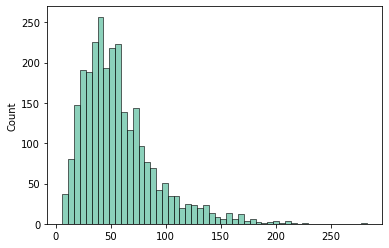

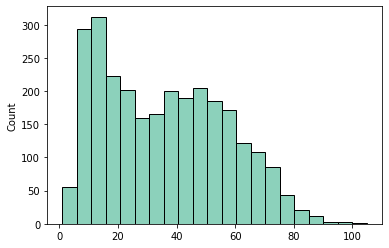

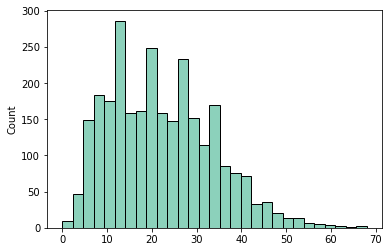

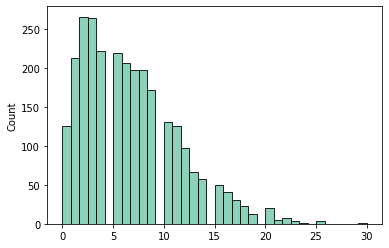

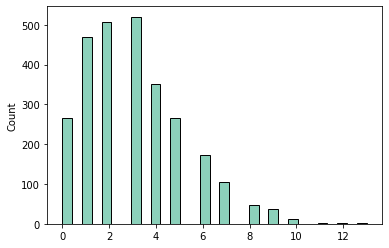

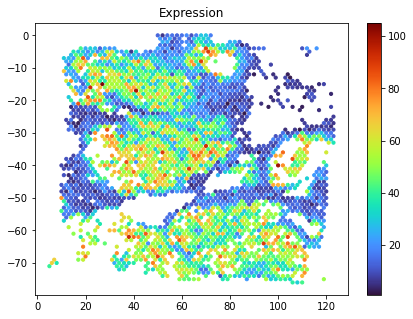

In [51]:
sns.histplot(adata_real.obs_vector('MT-CYB'))
plt.show()
sns.histplot(adata_real.obs_vector('HSP90AB1'))
plt.show()
sns.histplot(adata_real.obs_vector('RPS10'))
plt.show()
sns.histplot(adata_real.obs_vector('ILF2'))
plt.show()
sns.histplot(adata_real.obs_vector('NDUFS8'))
plt.show()

spatialcorr.plot_slide(
    adata_real.obs, 
    adata_real.obs_vector('HSP90AB1'), 
    cmap='turbo',
    colorbar=True,
    title='Expression',
    row_key='array_row',
    col_key='array_col',
    dsize=10
)

In [84]:
genes_gt_0_2_spots_gt_1_umi = gene_stats_df.loc[gene_stats_df['Fraction of spots w/ >1 UMI'] > 0.5].index
print(len(genes_gt_0_2_spots_gt_1_umi))

print('Target gene stats:')
print(gene_stats_df.loc[['CALML5', 'PECAM1']])
print()

gene_stats_df_restrict = gene_stats_df.loc[genes_gt_0_2_spots_gt_1_umi]

CALML5_median_umi = gene_stats_df_restrict.loc['CALML5']['Median UMI count']
quantile = np.sum(
        (np.array(gene_stats_df_restrict['Median UMI count']) > CALML5_median_umi).astype(int) \
    ) / gene_stats_df_restrict.shape[0]
print('CALML5 median UMI quantile: ', quantile)

CALML5_frac_spots = gene_stats_df_restrict.loc['CALML5']['Fraction of spots w/ >1 UMI']
quantile = np.sum(
        (np.array(gene_stats_df_restrict['Fraction of spots w/ >1 UMI']) > CALML5_frac_spots).astype(int) \
    ) / gene_stats_df_restrict.shape[0]
print('CALML5 fraction detected quantile: ', quantile)






PECAM1_median_umi = gene_stats_df_restrict.loc['PECAM1']['Median UMI count']
quantile = np.sum(
        (np.array(gene_stats_df['Median UMI count']) > PECAM1_median_umi).astype(int) \
    ) / gene_stats_df_restrict.shape[0]
print('PECAM1 median UMI quantile: ', quantile)

PECAM1_frac_spots = gene_stats_df_restrict.loc['PECAM1']['Fraction of spots w/ >1 UMI']
quantile = np.sum(
        (np.array(gene_stats_df_restrict['Fraction of spots w/ >1 UMI']) > PECAM1_frac_spots).astype(int) \
    ) / gene_stats_df_restrict.shape[0]
print('CALML5 fraction detected quantile: ', quantile)

4563
Target gene stats:
        Mean UMI count  Median UMI count  Number of spots w/ >1 UMI  \
CALML5       26.633200              22.0                       2759   
PECAM1        1.050381               1.0                       1547   

        Fraction of spots w/ >1 UMI  
CALML5                      1.00000  
PECAM1                      0.56071  

CALML5 median UMI quantile:  0.021034180543382998
CALML5 fraction detected quantile:  0.0
PECAM1 median UMI quantile:  0.3983347940403155
CALML5 fraction detected quantile:  0.8306310254163015


In [ ]:
NEW_mean_umi = gene_stats_df_restrict.loc['PECAM1']['Mean UMI count']
quantile = np.sum(
        (np.array(gene_stats_df['Mean UMI count']) > NEW_mean_umi).astype(int) \
    ) / gene_stats_df_restrict.shape[0]
print('PECAM1 mean UMI quantile: ', quantile)

NEW_frac_spots = gene_stats_df_restrict.loc['PECAM1']['Fraction of spots w/ >1 UMI']
quantile = np.sum(
        (np.array(gene_stats_df_restrict['Fraction of spots w/ >1 UMI']) > NEW_mean_umi).astype(int) \
    ) / gene_stats_df_restrict.shape[0]
print('CALML5 fraction detected quantile: ', quantile)

### Cluster plots

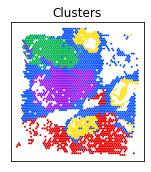

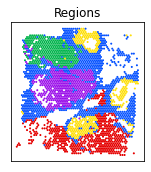

In [83]:
df_sim_data_cs_0_1_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_RPS10.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)

fig, ax = plt.subplots(
    1,
    1,
    figsize = (2.2,2.5)
)
spatialcorr.plot_slide(
    df_sim_data_cs_0_1_RPS10, 
    df_sim_data_cs_0_1_RPS10['cluster'], 
    cmap='categorical',
    #colorbar=True,
    #vmin=-1,
    #vmax=1,
    title='Clusters',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=ax
    #cat_palette = ['#f5e049', '#297bff']
)
ax.set_title('Clusters')
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/BHR_example_data_clusters.pdf'), format='pdf')
plt.show()

fig, ax = plt.subplots(
    1,
    1,
    figsize = (2.2,2.5)
)
spatialcorr.plot_slide(
    df_sim_data_cs_0_1_RPS10, 
    df_sim_data_cs_0_1_RPS10['cluster'],  
    cmap='categorical',
    #colorbar=True,
    #vmin=-1,
    #vmax=1,
    title='Regions',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=ax,
    #cat_palette = ['#f5e049', '#297bff']
)
ax.set_title('Regions')
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/BHR_example_data_clusters_V2.pdf'), format='pdf')

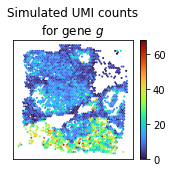

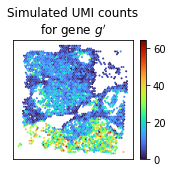

In [95]:
df_sim_data_cs_0_1_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_S100A13.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)
fig, ax = plt.subplots(
    1,
    1,
    figsize = (2.5,2.5)
)
spatialcorr.plot_slide(
    df_sim_data_cs_0_1_S100A13, 
    df_sim_data_cs_0_1_S100A13['count_gene_1'],  
    cmap='turbo',
    colorbar=True,
    #vmin=-1,
    #vmax=1,
    title='Simulated UMI counts\n'+r'for gene $g$',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=ax,
    figure=fig
    #cat_palette = ['#f5e049', '#297bff']
)
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/S100A13_simulated_gene_1.pdf'), format='pdf')

fig, ax = plt.subplots(
    1,
    1,
    figsize = (2.5,2.5)
)
spatialcorr.plot_slide(
    df_sim_data_cs_0_1_S100A13, 
    df_sim_data_cs_0_1_S100A13['count_gene_2'],  
    cmap='turbo',
    colorbar=True,
    #vmin=-1,
    #vmax=1,
    title="Simulated UMI counts\n"+r"for gene $g'$",
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=ax,
    figure=fig
    #cat_palette = ['#f5e049', '#297bff']
)
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/S100A13_simulated_gene_2.pdf'), format='pdf')

In [ ]:
fig, ax = plt.subplots(
    1,
    1,
    figsize = (2.5,2.5)
)
spatialcorr.plot_slide(
    adata_real.obs, 
    adata_real.obs_vector('S100A13'),  
    cmap='turbo',
    colorbar=True,
    #vmin=-1,
    #vmax=1,
    title='Target gene UMI counts',
    row_key='array_row',
    col_key='array_col',
    dsize=1,
    ticks=False,
    ax=ax,
    figure=fig
    #cat_palette = ['#f5e049', '#297bff']
)
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/S100A13_Expression.pdf'), format='pdf')

In [ ]:
fig, ax = plt.subplots(
    1,
    1,
    figsize = (3,2.5)
)
spatialcorr.plot_slide(
    adata_real.obs, 
    np.sum(adata_real.X, axis=1),  
    cmap='turbo',
    colorbar=True,
    #vmin=-1,
    #vmax=1,
    title='Total UMI counts',
    row_key='array_row',
    col_key='array_col',
    dsize=1,
    ticks=False,
    ax=ax,
    figure=fig
    #cat_palette = ['#f5e049', '#297bff']
)
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/total_count_sim_data.pdf'), format='pdf')

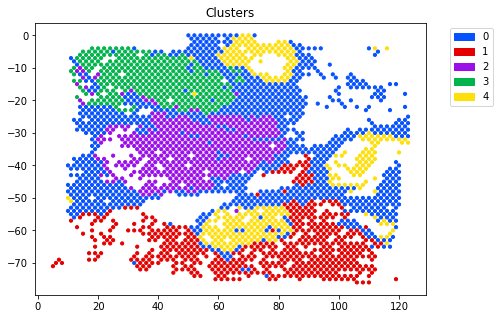

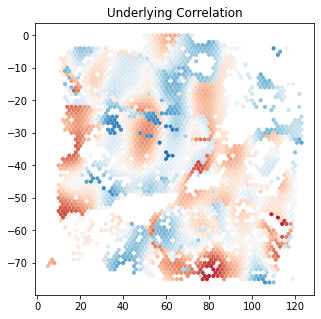

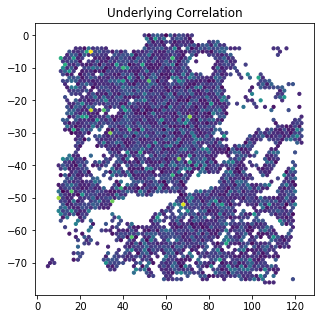

In [52]:
df_sim_data_cs_0_0_spotwise_CALML5 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_CALML5.sigma.10.cs.0_1.condition.mult_clusts/0.tsv'),
    sep='\t', index_col=0
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_0_spotwise_CALML5, 
    df_sim_data_cs_0_0_spotwise_CALML5['cluster'], 
    cmap='categorical',
    colorbar=True,
    title='Clusters',
    row_key='row',
    col_key='col',
    dsize=10
)
plt.show()

spatialcorr.plot_slide(
    df_sim_data_cs_0_0_spotwise_CALML5, 
    df_sim_data_cs_0_0_spotwise_CALML5['correlation'], 
    cmap='RdBu_r',
    colorbar=False,
    title='Underlying Correlation',
    row_key='row',
    col_key='col',
    vmin=-1,
    vmax=1,
    dsize=10
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_0_spotwise_CALML5, 
    df_sim_data_cs_0_0_spotwise_CALML5['dino_gene_1'], 
    #cmap='RdBu_r',
    colorbar=False,
    title='Underlying Correlation',
    row_key='row',
    col_key='col',
    #vmin=-1,
    #vmax=1,
    dsize=10
)

Show data with spotwise size factors

## Create publication figures comparing simulated to real data

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


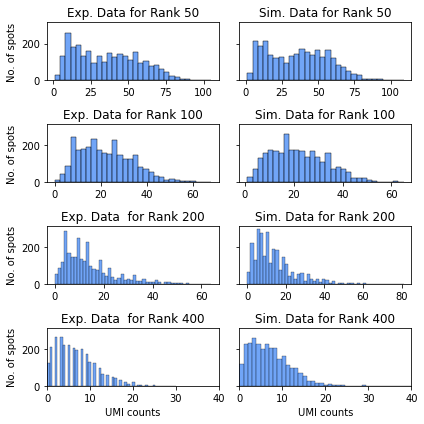

In [75]:
adata_real = sc.datasets.visium_sge(sample_id="V1_Breast_Cancer_Block_A_Section_1")
adata_real.X = adata_real.X.todense()
sc.pp.filter_cells(adata_real, min_counts=5000)
sc.pp.filter_cells(adata_real, max_counts=35000)

df_sim_data_cs_0_1_spotwise_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_HSP90AB1.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_1_spotwise_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_RPS10.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_1_spotwise_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_S100A13.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_1_spotwise_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_ILF2.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_1_spotwise_NDUFS8 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_NDUFS8.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)

fig, axarr = plt.subplots(
    4,
    2,
    figsize=(6,6),
    sharey=True
)
sns.histplot(
    adata_real.obs_vector('HSP90AB1'), 
    bins=30, 
    ax=axarr[0][0], 
    color='#4287f5'
)
sns.histplot(
    df_sim_data_cs_0_1_spotwise_HSP90AB1['count_gene_1'], 
    bins=30, 
    ax=axarr[0][1],
    color='#4287f5'
)
sns.histplot(
    adata_real.obs_vector('RPS10'), 
    bins=30, 
    ax=axarr[1][0], 
    color='#4287f5'
)
sns.histplot(
    df_sim_data_cs_0_1_spotwise_RPS10['count_gene_1'], 
    bins=30, 
    ax=axarr[1][1],
    color='#4287f5'
    )
sns.histplot(
    adata_real.obs_vector('S100A13'), 
    bins=50, 
    ax=axarr[2][0],
    color='#4287f5'
)
sns.histplot(
    df_sim_data_cs_0_1_spotwise_S100A13['count_gene_1'], 
    bins=50, 
    ax=axarr[2][1],
    color='#4287f5'
)
sns.histplot(
    adata_real.obs_vector('ILF2'), 
    bins=50, 
    ax=axarr[3][0],
    color='#4287f5'
)
sns.histplot(
    df_sim_data_cs_0_1_spotwise_ILF2['count_gene_1'], 
    bins=50, 
    ax=axarr[3][1],
    color='#4287f5'
)

#sns.histplot(
#    adata_real.obs_vector('NDUFS8'), 
#    bins=50, 
#    ax=axarr[2][0],
#    color='#4287f5'
#)
#sns.histplot(
#    df_sim_data_cs_0_1_spotwise_NDUFS8['count_gene_1'], 
#    bins=50, 
#    ax=axarr[2][1],
#    color='#4287f5'
#)

#axarr[0][0].set_ylim((0, 600))
#axarr[0][1].set_ylim((0, 600))
#axarr[0][0].set_xlim((0, 160))
#axarr[0][1].set_xlim((0, 160))
#axarr[1][0].set_ylim((0, 1500))
#axarr[1][1].set_ylim((0, 1500))
#axarr[1][0].set_xlim((0, 20))
#axarr[1][1].set_xlim((0, 20))
axarr[3][0].set_xlim((0, 40))
axarr[3][1].set_xlim((0, 40))
axarr[0][0].set_title('Exp. Data for Rank 50')
axarr[0][1].set_title('Sim. Data for Rank 50')
axarr[1][0].set_title('Exp. Data for Rank 100')
axarr[1][1].set_title('Sim. Data for Rank 100')
axarr[2][0].set_title('Exp. Data  for Rank 200')
axarr[2][1].set_title('Sim. Data for Rank 200')
axarr[3][0].set_title('Exp. Data  for Rank 400')
axarr[3][1].set_title('Sim. Data for Rank 400')
axarr[3][0].set_xlabel('UMI counts')
axarr[3][1].set_xlabel('UMI counts')
axarr[0][0].set_xlabel('')
axarr[0][1].set_xlabel('')
axarr[1][0].set_xlabel('')
axarr[1][1].set_xlabel('')
axarr[2][0].set_xlabel('')
axarr[2][1].set_xlabel('')
axarr[0][0].set_ylabel('No. of spots')
axarr[1][0].set_ylabel('No. of spots')
axarr[2][0].set_ylabel('No. of spots')
axarr[3][0].set_ylabel('No. of spots')
axarr[0][1].set_ylabel('')
axarr[1][1].set_ylabel('')
axarr[2][1].set_ylabel('')

plt.tight_layout()
plt.savefig('./figures/simulated_vs_real_hists.pdf', format='pdf')
plt.show()

## Look at data from null distribution

In [83]:
df_sim_sig_5_cs_0_0_spotwise_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_HSP90AB1.sigma.10.cs.0_0.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_0_spotwise_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_RPS10.sigma.10.cs.0_0.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_0_spotwise_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_S100A13.sigma.10.cs.0_0.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_0_spotwise_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_ILF2.sigma.10.cs.0_0.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)

In [85]:
all_pvals = list(df_sim_sig_5_cs_0_0_spotwise_HSP90AB1['p_value']) \
    + list(df_sim_sig_5_cs_0_0_spotwise_RPS10['p_value']) \
    + list(df_sim_sig_5_cs_0_0_spotwise_S100A13['p_value']) \
    + list(df_sim_sig_5_cs_0_0_spotwise_ILF2['p_value'])
fpr = len([x for x in all_pvals if x < 0.05]) / len(all_pvals)
print("False positive rate: ", fpr)

False positive rate:  0.03375


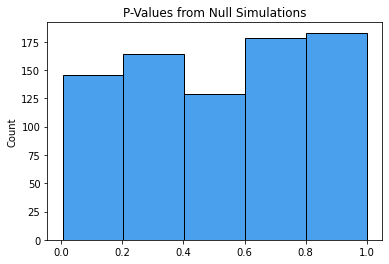

In [90]:
sns.histplot(all_pvals, bins=5, color='#0D80E7')
plt.title("P-Values from Null Simulations")
plt.show()

## Look at null data with alternative normalization algorithms

In [37]:
df_sim_data_cs_0_0_HSP90AB1_dino = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_HSP90AB1.sigma.10.cs.0_0.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)

df_sim_data_cs_0_0_HSP90AB1_bindevres = pd.read_csv(
    join(DATA_ROOT, 'bindevres_normalized_simulated_datasets/gene.all_HSP90AB1.sigma.10.cs.0_0.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)

df_sim_data_cs_0_0_HSP90AB1_log1cpm = pd.read_csv(
    join(DATA_ROOT, 'log1cpm_normalized_simulated_datasets/gene.all_HSP90AB1.sigma.10.cs.0_0.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)


df_sim_data_cs_0_0_ILF2_dino = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_ILF2.sigma.10.cs.0_0.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)

df_sim_data_cs_0_0_ILF2_bindevres = pd.read_csv(
    join(DATA_ROOT, 'bindevres_normalized_simulated_datasets/gene.all_ILF2.sigma.10.cs.0_0.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)

df_sim_data_cs_0_0_ILF2_log1cpm = pd.read_csv(
    join(DATA_ROOT, 'log1cpm_normalized_simulated_datasets/gene.all_ILF2.sigma.10.cs.0_0.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)



/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


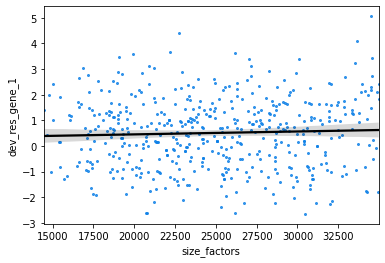

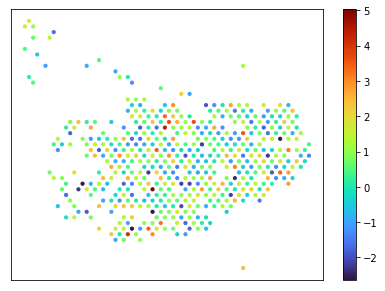

In [39]:
sns.regplot(
    df_sim_data_cs_0_0_HSP90AB1_bindevres.loc[df_sim_data_cs_0_0_HSP90AB1_bindevres['cluster'] == 2]['size_factors'],
    df_sim_data_cs_0_0_HSP90AB1_bindevres.loc[df_sim_data_cs_0_0_HSP90AB1_bindevres['cluster'] == 2]['dev_res_gene_1'],
    scatter_kws={'s': 4, 'color': '#0D80E7'},
    line_kws={'color': 'black'}
)
plt.show()
spatialcorr.plot_slide(
    df_sim_data_cs_0_0_HSP90AB1_bindevres.loc[df_sim_data_cs_0_0_HSP90AB1_bindevres['cluster'] == 2], 
    df_sim_data_cs_0_0_HSP90AB1_bindevres.loc[df_sim_data_cs_0_0_HSP90AB1_bindevres['cluster'] == 2]['dev_res_gene_1'], 
    cmap='turbo',
    colorbar=True,
    #vmin=-1,
    #vmax=1,
    #title="Simulated UMI counts\n"+r"for gene $g'$",
    row_key='row',
    col_key='col',
    dsize=10,
    ticks=False
    #ax=ax,
    #figure=fig
    #cat_palette = ['#f5e049', '#297bff']
)
plt.show()

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


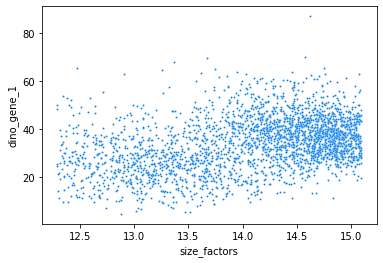

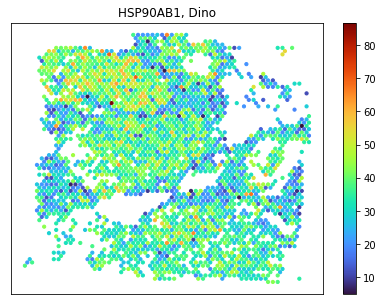

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


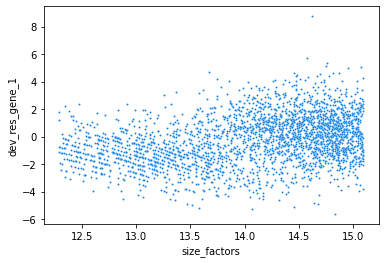

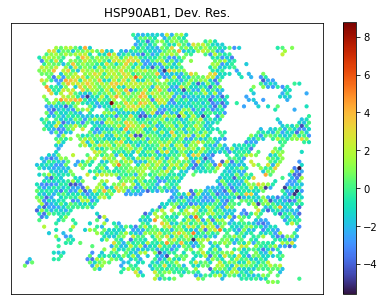

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


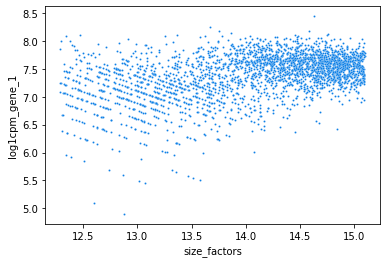

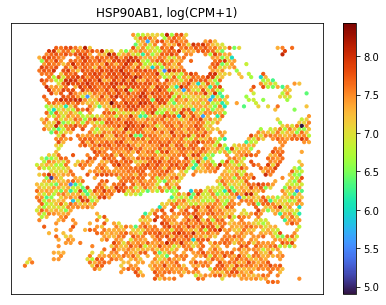

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


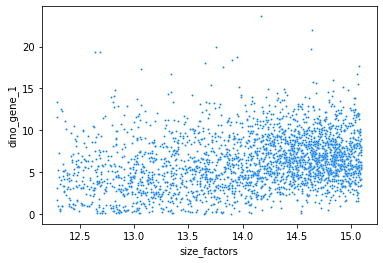

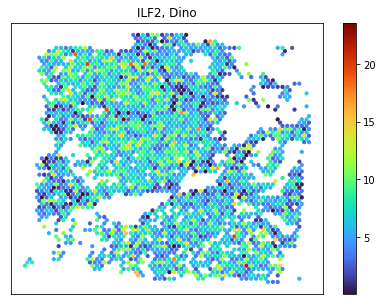

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


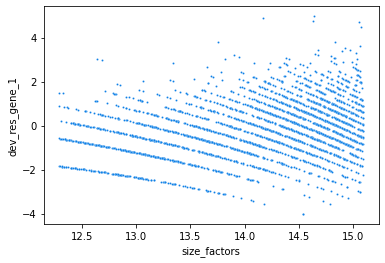

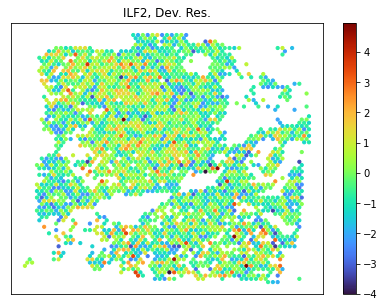

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


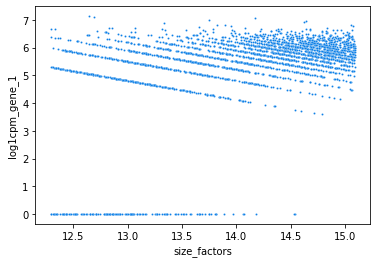

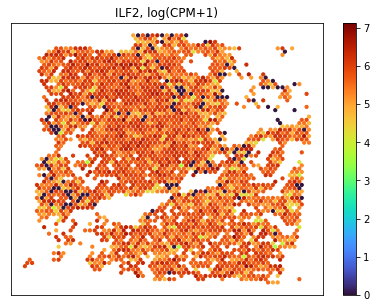

In [48]:
def plot_ls_vs_expr(df, units, title=None, clust=None):
    if clust:
        df = df.copy().loc[df['cluster'] == clust]
    
    sns.scatterplot(
        np.log2(df['size_factors']),
        df[f'{units}_gene_1'],
        s=4, 
        color='#0D80E7',
        #line_kws={'color': 'black'}
    )
    plt.show()
    spatialcorr.plot_slide(
        df, 
        df[f'{units}_gene_1'],  
        cmap='turbo',
        colorbar=True,
        #vmin=-1,
        #vmax=1,
        title=title,
        row_key='row',
        col_key='col',
        dsize=10,
        ticks=False
        #ax=ax,
        #figure=fig
        #cat_palette = ['#f5e049', '#297bff']
    )
    plt.show()
    

#plot_ls_vs_expr(df_sim_data_cs_0_0_HSP90AB1_dino, 'dino', 'HSP90AB1, Dino', clust=2)
#plot_ls_vs_expr(df_sim_data_cs_0_0_HSP90AB1_bindevres, 'dev_res', 'HSP90AB1, Dev. Res.', clust=2)
#plot_ls_vs_expr(df_sim_data_cs_0_0_HSP90AB1_log1cpm, 'log1cpm', 'HSP90AB1, log(CPM+1)', clust=2)

plot_ls_vs_expr(df_sim_data_cs_0_0_HSP90AB1_dino, 'dino', 'HSP90AB1, Dino')
plot_ls_vs_expr(df_sim_data_cs_0_0_HSP90AB1_bindevres, 'dev_res', 'HSP90AB1, Dev. Res.')
plot_ls_vs_expr(df_sim_data_cs_0_0_HSP90AB1_log1cpm, 'log1cpm', 'HSP90AB1, log(CPM+1)')

#plot_ls_vs_expr(df_sim_data_cs_0_0_ILF2_dino, 'dino', 'ILF2, Dino', clust=2)
#plot_ls_vs_expr(df_sim_data_cs_0_0_ILF2_bindevres, 'dev_res', 'ILF2, Dev. Res.', clust=2)
#plot_ls_vs_expr(df_sim_data_cs_0_0_ILF2_log1cpm, 'log1cpm', 'ILF2, log(CPM+1)', clust=2)

plot_ls_vs_expr(df_sim_data_cs_0_0_ILF2_dino, 'dino', 'ILF2, Dino')
plot_ls_vs_expr(df_sim_data_cs_0_0_ILF2_bindevres, 'dev_res', 'ILF2, Dev. Res.')
plot_ls_vs_expr(df_sim_data_cs_0_0_ILF2_log1cpm, 'log1cpm', 'ILF2, log(CPM+1)')


### Results on simulations with differing median expression and varying intensity of spatially varying correlation

Load the results from the statistical test

In [12]:
#MT-CYB
#HSP90AB1
#RPS10
#S100A13
#ILF2
#NDUFS8

# Rank 50
df_sim_sig_5_cs_0_05_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_HSP90AB1_HSP90AB1.sigma.10.cs.0_05.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_1_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_HSP90AB1_HSP90AB1.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_2_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_HSP90AB1_HSP90AB1.sigma.10.cs.0_2.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_4_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_HSP90AB1_HSP90AB1.sigma.10.cs.0_4.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)

# Rank 100
df_sim_sig_5_cs_0_05_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_RPS10_RPS10.sigma.10.cs.0_05.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_1_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_RPS10_RPS10.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_2_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_RPS10_RPS10.sigma.10.cs.0_2.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_4_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_RPS10_RPS10.sigma.10.cs.0_4.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)

# Rank 200
df_sim_sig_5_cs_0_05_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_05.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_1_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_2_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_2.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_4_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_4.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)

# Rank 400
df_sim_sig_5_cs_0_05_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_ILF2_ILF2.sigma.10.cs.0_05.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_1_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_ILF2_ILF2.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_2_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_ILF2_ILF2.sigma.10.cs.0_2.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_4_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_ILF2_ILF2.sigma.10.cs.0_4.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)

# Rank 800
df_sim_sig_5_cs_0_05_NDUFS8 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_NDUFS8_NDUFS8.sigma.10.cs.0_05.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_1_NDUFS8 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_NDUFS8_NDUFS8.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_2_NDUFS8 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_NDUFS8_NDUFS8.sigma.10.cs.0_2.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_4_NDUFS8 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_NDUFS8_NDUFS8.sigma.10.cs.0_4.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)

Load a few example simulated datasets just to visualize them

In [56]:
# Rank 50
df_sim_data_cs_0_05_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_HSP90AB1.sigma.10.cs.0_05.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_1_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_HSP90AB1.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_2_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_HSP90AB1.sigma.10.cs.0_2.condition.mult_clusts.per_clust_stats/3.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_4_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_HSP90AB1.sigma.10.cs.0_4.condition.mult_clusts.per_clust_stats/3.tsv'),
    sep='\t', index_col=0
)

# Rank 100
df_sim_data_cs_0_05_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_RPS10.sigma.10.cs.0_05.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_1_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_RPS10.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_2_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_RPS10.sigma.10.cs.0_2.condition.mult_clusts.per_clust_stats/3.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_4_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_RPS10.sigma.10.cs.0_4.condition.mult_clusts.per_clust_stats/3.tsv'),
    sep='\t', index_col=0
)

# Rank 200
df_sim_data_cs_0_05_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_S100A13.sigma.10.cs.0_05.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_1_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_S100A13.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_2_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_S100A13.sigma.10.cs.0_2.condition.mult_clusts.per_clust_stats/3.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_4_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_S100A13.sigma.10.cs.0_4.condition.mult_clusts.per_clust_stats/3.tsv'),
    sep='\t', index_col=0
)

# Rank 400
df_sim_data_cs_0_05_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_ILF2.sigma.10.cs.0_05.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_1_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_ILF2.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_2_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_ILF2.sigma.10.cs.0_2.condition.mult_clusts.per_clust_stats/3.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_4_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_ILF2.sigma.10.cs.0_4.condition.mult_clusts.per_clust_stats/3.tsv'),
    sep='\t', index_col=0
)

# Rank 800
df_sim_data_cs_0_05_NDUFS8 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_NDUFS8.sigma.10.cs.0_05.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_1_NDUFS8 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_NDUFS8.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_2_NDUFS8 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_NDUFS8.sigma.10.cs.0_2.condition.mult_clusts.per_clust_stats/3.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_4_NDUFS8 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.all_NDUFS8.sigma.10.cs.0_4.condition.mult_clusts.per_clust_stats/3.tsv'),
    sep='\t', index_col=0
)



Create a nice figure with some of this data for a publication

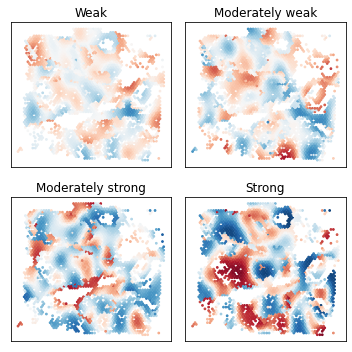

In [76]:
figure, axarr = plt.subplots(
    2,
    2,
    figsize = (5,5)
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_05_RPS10, 
    df_sim_data_cs_0_05_RPS10['correlation'], 
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='Weak',
    #title='CS = 0.05',
    row_key='row',
    col_key='col',
    dsize=3,
    ticks=False,
    ax=axarr[0][0]
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_1_RPS10, 
    df_sim_data_cs_0_1_RPS10['correlation'],  
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='Moderately weak',
    #title='CS = 0.1',
    row_key='row',
    col_key='col',
    dsize=3,
    ticks=False,
    ax=axarr[0][1]
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_2_RPS10, 
    df_sim_data_cs_0_2_RPS10['correlation'],  
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='Moderately strong',
    #title='CS = 0.2',
    row_key='row',
    col_key='col',
    dsize=3,
    ticks=False,
    ax=axarr[1][0]
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_4_RPS10, 
    df_sim_data_cs_0_4_RPS10['correlation'],  
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='Strong',
    #title='CS = 0.4',
    row_key='row',
    col_key='col',
    dsize=3,
    ticks=False,
    ax=axarr[1][1]
)

plt.tight_layout()
figure.savefig(join(DATA_ROOT, 'figures/scHOT_vs_SpatialCorr_example_data.pdf'), format='pdf')

plt.show()

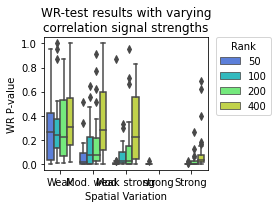

In [63]:
X_LABEL = 'Spatial Variation'

da = [
    (p_val, 'Weak', '50')
    for p_val in df_sim_sig_5_cs_0_05_HSP90AB1['p_value']
]
da += [
    (p_val, 'Mod. weak', '50')
    for p_val in df_sim_sig_5_cs_0_1_HSP90AB1['p_value']
]
da += [
    (p_val, 'Mod. strong', '50')
    for p_val in df_sim_sig_5_cs_0_2_HSP90AB1['p_value']
]
da += [
    (p_val, 'strong', '50')
    for p_val in df_sim_sig_5_cs_0_4_HSP90AB1['p_value']
]


da += [
    (p_val, 'Weak', '100')
    for p_val in df_sim_sig_5_cs_0_05_RPS10['p_value']
]
da += [
    (p_val, 'Mod. weak', '100')
    for p_val in df_sim_sig_5_cs_0_1_RPS10['p_value']
]
da += [
    (p_val, 'Mod. strong', '100')
    for p_val in df_sim_sig_5_cs_0_2_RPS10['p_value']
]
da += [
    (p_val, 'Strong', '100')
    for p_val in df_sim_sig_5_cs_0_4_RPS10['p_value']
]

# Rank 200
da += [
    (p_val, 'Weak', '200')
    for p_val in df_sim_sig_5_cs_0_05_S100A13['p_value']
]
da += [
    (p_val, 'Mod. weak', '200')
    for p_val in df_sim_sig_5_cs_0_1_S100A13['p_value']
]
da += [
    (p_val, 'Mod. strong', '200')
    for p_val in df_sim_sig_5_cs_0_2_S100A13['p_value']
]
da += [
    (p_val, 'Strong', '200')
    for p_val in df_sim_sig_5_cs_0_4_S100A13['p_value']
]


da += [
    (p_val, 'Weak', '400')
    for p_val in df_sim_sig_5_cs_0_05_ILF2['p_value']
]
da += [
    (p_val, 'Mod. weak', '400')
    for p_val in df_sim_sig_5_cs_0_1_ILF2['p_value']
]
da += [
    (p_val, 'Mod. strong', '400')
    for p_val in df_sim_sig_5_cs_0_2_ILF2['p_value']
]
da += [
    (p_val, 'Strong', '400')
    for p_val in df_sim_sig_5_cs_0_4_ILF2['p_value']
]

"""
da += [
    (p_val, 'Weak', '800')
    for p_val in df_sim_sig_5_cs_0_05_NDUFS8['p_value']
]
da += [
    (p_val, 'Mod. weak', '800')
    for p_val in df_sim_sig_5_cs_0_1_NDUFS8['p_value']
]
da += [
    (p_val, 'Mod. strong', '800')
    for p_val in df_sim_sig_5_cs_0_2_NDUFS8['p_value']
]
da += [
    (p_val, 'Strong', '800')
    for p_val in df_sim_sig_5_cs_0_4_NDUFS8['p_value']
]
"""

plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', X_LABEL, 'Simulated Expression']
)


fig, ax = plt.subplots(
    1,
    1,
    figsize=(4,3)
)
sns.set_palette(sns.color_palette("turbo"))
sns.boxplot(data=plot_df, x=X_LABEL, y='P-value', hue='Simulated Expression', ax=ax)
#sns.stripplot(data=plot_df, x='Covariance Strength', y='P-value', hue='Simulated Expression', color='black')
#plt.show()



ax.set_title('WR-test results with varying\ncorrelation signal strengths')
ax.set_ylabel('WR P-value')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., title="Rank")
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/distr_p_vals_high_low_expression_change_cov_strength.pdf'), format='pdf')

sns.set_palette("Set2")

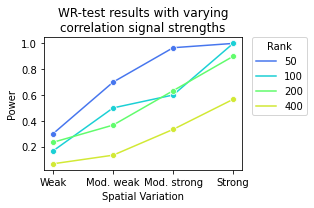

In [66]:
X_LABEL = 'Spatial Variation'
P_VAL_THRESH = 0.05

da = []

L1_STR = 'Weak'
L2_STR = 'Mod. weak'
L3_STR = 'Mod. strong'
L4_STR = 'Strong'

fdr = len([x for x in df_sim_sig_5_cs_0_05_HSP90AB1['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_05_HSP90AB1['p_value'])
da.append([fdr, L1_STR, '50'])
fdr = len([x for x in df_sim_sig_5_cs_0_1_HSP90AB1['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_1_HSP90AB1['p_value'])
da.append([fdr, L2_STR, '50'])
fdr = len([x for x in df_sim_sig_5_cs_0_2_HSP90AB1['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_2_HSP90AB1['p_value'])
da.append([fdr, L3_STR, '50'])
fdr = len([x for x in df_sim_sig_5_cs_0_4_HSP90AB1['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_4_HSP90AB1['p_value'])
da.append([fdr, L4_STR, '50'])

fdr = len([x for x in df_sim_sig_5_cs_0_05_RPS10['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_05_RPS10['p_value'])
da.append([fdr, L1_STR, '100'])
fdr = len([x for x in df_sim_sig_5_cs_0_1_RPS10['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_1_RPS10['p_value'])
da.append([fdr, L2_STR, '100'])
fdr = len([x for x in df_sim_sig_5_cs_0_2_RPS10['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_2_RPS10['p_value'])
da.append([fdr, L3_STR, '100'])
fdr = len([x for x in df_sim_sig_5_cs_0_4_RPS10['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_4_RPS10['p_value'])
da.append([fdr, L4_STR, '100'])

fdr = len([x for x in df_sim_sig_5_cs_0_05_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_05_S100A13['p_value'])
da.append([fdr, L1_STR, '200'])
fdr = len([x for x in df_sim_sig_5_cs_0_1_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_1_S100A13['p_value'])
da.append([fdr, L2_STR, '200'])
fdr = len([x for x in df_sim_sig_5_cs_0_2_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_2_S100A13['p_value'])
da.append([fdr, L3_STR, '200'])
fdr = len([x for x in df_sim_sig_5_cs_0_4_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_4_S100A13['p_value'])
da.append([fdr, L4_STR, '200'])

fdr = len([x for x in df_sim_sig_5_cs_0_05_ILF2['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_05_ILF2['p_value'])
da.append([fdr, L1_STR, '400'])
fdr = len([x for x in df_sim_sig_5_cs_0_1_ILF2['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_1_ILF2['p_value'])
da.append([fdr, L2_STR, '400'])
fdr = len([x for x in df_sim_sig_5_cs_0_2_ILF2['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_2_ILF2['p_value'])
da.append([fdr, L3_STR, '400'])
fdr = len([x for x in df_sim_sig_5_cs_0_4_ILF2['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_4_ILF2['p_value'])
da.append([fdr, L4_STR, '400'])

plot_df = pd.DataFrame(
    data=da,
    columns=['Power', X_LABEL, 'Simulated Expression']
)

fig, ax = plt.subplots(
    1,
    1,
    figsize=(4.5,3)
)
sns.set_palette(sns.color_palette("turbo"))
sns.lineplot(data=plot_df, x=X_LABEL, y='Power', hue='Simulated Expression', marker='o', ax=ax)
#sns.stripplot(data=plot_df, x='Covariance Strength', y='P-value', hue='Simulated Expression', color='black')
#plt.show()



ax.set_title('WR-test results with varying\ncorrelation signal strengths')
ax.set_ylabel('Power')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., title="Rank")
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/power_high_low_expression_change_cov_strength.pdf'), format='pdf')

sns.set_palette("Set2")

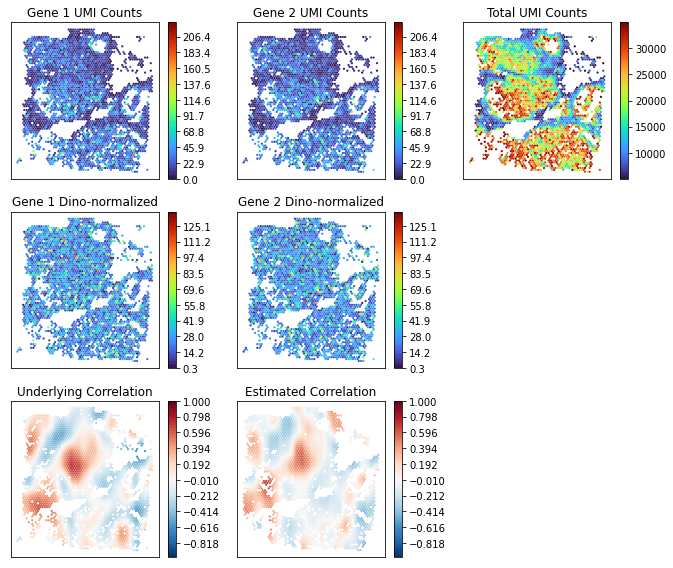

In [18]:
df_sim_data_cs_0_1_spotwise_v2 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_CALML5.CALML5_sigma_10_cs_0.1/0.tsv'),
    sep='\t', index_col=0
)

figure, axarr = plt.subplots(
    3,
    3,
    figsize = (9.5, 8)
)


min_count = min(list(df_sim_data_cs_0_1_spotwise_v2['count_gene_1']) + list(df_sim_data_cs_0_1_spotwise_v2['count_gene_2']))
max_count = max(list(df_sim_data_cs_0_1_spotwise_v2['count_gene_1']) + list(df_sim_data_cs_0_1_spotwise_v2['count_gene_2']))
spatialcorr.plot_slide(
    df_sim_data_cs_0_1_spotwise_v2, 
    df_sim_data_cs_0_1_spotwise_v2['count_gene_1'], 
    cmap='turbo',
    colorbar=True,
    vmin=min_count,
    vmax=max_count,
    title='Gene 1 UMI Counts',
    row_key='row',
    col_key='col',
    dsize=1.5,
    ticks=False,
    ax=axarr[0][0],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_1_spotwise_v2, 
    df_sim_data_cs_0_1_spotwise_v2['count_gene_2'], 
    cmap='turbo',
    colorbar=True,
    vmin=min_count,
    vmax=max_count,
    title='Gene 2 UMI Counts',
    row_key='row',
    col_key='col',
    dsize=1.5,
    ticks=False,
    ax=axarr[0][1],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_1_spotwise_v2, 
    #np.log10(df_sim_data_cs_0_1_spotwise_v2['size_factors']),
    df_sim_data_cs_0_1_spotwise_v2['size_factors'],
    cmap='turbo',
    colorbar=True,
    #vmin=min_count,
    #vmax=max_count,
    title='Total UMI Counts',
    row_key='row',
    col_key='col',
    dsize=1.5,
    ticks=False,
    ax=axarr[0][2],
    figure=figure
)

min_dino = min(
    list(df_sim_data_cs_0_1_spotwise_v2['dino_gene_1']) \
    + list(df_sim_data_cs_0_1_spotwise_v2['dino_gene_2'])
)
max_dino = max(
    list(df_sim_data_cs_0_1_spotwise_v2['dino_gene_1']) \
    + list(df_sim_data_cs_0_1_spotwise_v2['dino_gene_2'])
)
spatialcorr.plot_slide(
    df_sim_data_cs_0_1_spotwise_v2, 
    df_sim_data_cs_0_1_spotwise_v2['dino_gene_1'], 
    cmap='turbo',
    colorbar=True,
    vmin=min_dino,
    vmax=max_dino,
    title='Gene 1 Dino-normalized',
    row_key='row',
    col_key='col',
    dsize=1.5,
    ticks=False,
    ax=axarr[1][0],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_1_spotwise_v2, 
    df_sim_data_cs_0_1_spotwise_v2['dino_gene_2'], 
    cmap='turbo',
    colorbar=True,
    vmin=min_dino,
    vmax=max_dino,
    title='Gene 2 Dino-normalized',
    row_key='row',
    col_key='col',
    dsize=1.5,
    ticks=False,
    ax=axarr[1][1],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_1_spotwise_v2, 
    df_sim_data_cs_0_1_spotwise_v2['correlation'], 
    cmap='RdBu_r',
    colorbar=True,
    vmin=-1,
    vmax=1,
    title='Underlying Correlation',
    row_key='row',
    col_key='col',
    dsize=1.5,
    ticks=False,
    ax=axarr[2][0],
    figure=figure
)

sim_corrs, keep_inds = spatialcorr.utils.compute_local_correlation(
    AnnData(
        X=np.array([
            df_sim_data_cs_0_1_spotwise_v2['dino_gene_1'],
            df_sim_data_cs_0_1_spotwise_v2['dino_gene_2']
        ]).T,
        obs=df_sim_data_cs_0_1_spotwise_v2
    ),
    'dino_gene_1',
    'dino_gene_2',
    row_key='row',
    col_key='col',
    condition=None,
    sigma=5,
    contrib_thresh=10
)

spatialcorr.plot_slide(
    df_sim_data_cs_0_1_spotwise_v2.iloc[keep_inds], 
    sim_corrs, 
    cmap='RdBu_r',
    colorbar=True,
    vmin=-1,
    vmax=1,
    title='Estimated Correlation',
    row_key='row',
    col_key='col',
    dsize=1.5,
    ticks=False,
    ax=axarr[2][1],
    figure=figure
)

axarr[1][2].set_visible(False)
axarr[2][2].set_visible(False)

plt.tight_layout()
figure.savefig(join(DATA_ROOT, 'figures/dino_normalized_simulation.pdf'), format='pdf')

#### Test on a more lowly expressed genes

In [45]:
df_sim_data_cs_0_0025_spotwise_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_PECAM1.PECAM1_sigma_10_cs_0.0025/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_025_spotwise_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_PECAM1.PECAM1_sigma_10_cs_0.025/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_05_spotwise_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_PECAM1.PECAM1_sigma_10_cs_0.05/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_1_spotwise_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_PECAM1.PECAM1_sigma_10_cs_0.1/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_cs_0_2_spotwise_PECAM1 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/g_PECAM1.PECAM1_sigma_10_cs_0.2/0.tsv'),
    sep='\t', index_col=0
)

In [9]:
df_sim_sig_5_cs_0_025_spotwise_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_025.condition.mult_clusts.per_clust_stats.tsv'),
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_05_spotwise_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_05.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_1_spotwise_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_2_spotwise_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_2.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)

In [81]:
df_sim_sig_5_cs_0_0025_spotwise_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_ILF2_ILF2.sigma.10.cs.0_0025.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_025_spotwise_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_ILF2_ILF2.sigma.10.cs.0_025.condition.mult_clusts.tsv'),
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_05_spotwise_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_ILF2_ILF2.sigma.10.cs.0_05.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_1_spotwise_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_ILF2_ILF2.sigma.10.cs.0_1.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)

In [47]:
df_sim_sig_5_cs_0_025_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_HSP90AB1_HSP90AB1.sigma.10.cs.0_025.condition.mult_clusts.per_clust_stats.tsv'),
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_05_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_HSP90AB1_HSP90AB1.sigma.10.cs.0_05.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_1_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_HSP90AB1_HSP90AB1.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_cs_0_2_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-gene.all_HSP90AB1_HSP90AB1.sigma.10.cs.0_2.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)

## Compare different kernel bandwidths

In [8]:
df_sim_sig_2_5_cs_0_05_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.2_5.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_05.condition.mult_clusts.per_clust_stats.tsv'),
    sep='\t', 
    index_col=0
)
df_sim_sig_2_5_cs_0_1_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.2_5.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats.tsv'),
    sep='\t', 
    index_col=0
)
df_sim_sig_2_5_cs_0_2_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.2_5.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_2.condition.mult_clusts.per_clust_stats.tsv'),
    sep='\t', 
    index_col=0
)
df_sim_sig_2_5_cs_0_4_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.2_5.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_4.condition.mult_clusts.per_clust_stats.tsv'),
    sep='\t', 
    index_col=0
)

df_sim_sig_10_cs_0_05_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.10.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_05.condition.mult_clusts.per_clust_stats.tsv'),
    sep='\t', 
    index_col=0
)
df_sim_sig_10_cs_0_1_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.10.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats.tsv'),
    sep='\t', 
    index_col=0
)
df_sim_sig_10_cs_0_2_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.10.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_2.condition.mult_clusts.per_clust_stats.tsv'),
    sep='\t', 
    index_col=0
)
df_sim_sig_10_cs_0_4_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.10.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_4.condition.mult_clusts.per_clust_stats.tsv'),
    sep='\t', 
    index_col=0
)

df_sim_sig_20_cs_0_05_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.20.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_05.condition.mult_clusts.per_clust_stats.tsv'),
    sep='\t', 
    index_col=0
)
df_sim_sig_20_cs_0_1_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.20.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_1.condition.mult_clusts.per_clust_stats.tsv'),
    sep='\t', 
    index_col=0
)
df_sim_sig_20_cs_0_2_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.20.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_2.condition.mult_clusts.per_clust_stats.tsv'),
    sep='\t', 
    index_col=0
)
df_sim_sig_20_cs_0_4_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.20.condition.mult_clusts.test.within.features.dino-gene.all_S100A13_S100A13.sigma.10.cs.0_4.condition.mult_clusts.per_clust_stats.tsv'),
    sep='\t', 
    index_col=0
)

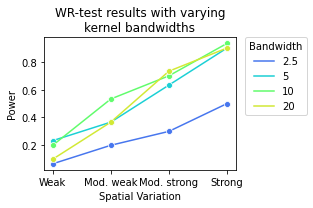

In [14]:
X_LABEL = 'Spatial Variation'
P_VAL_THRESH = 0.05

da = []

L1_STR = 'Weak'
L2_STR = 'Mod. weak'
L3_STR = 'Mod. strong'
L4_STR = 'Strong'

fdr = len([x for x in df_sim_sig_2_5_cs_0_05_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_2_5_cs_0_05_S100A13['p_value'])
da.append([fdr, L1_STR, '2.5'])
fdr = len([x for x in df_sim_sig_2_5_cs_0_1_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_2_5_cs_0_1_S100A13['p_value'])
da.append([fdr, L2_STR, '2.5'])
fdr = len([x for x in df_sim_sig_2_5_cs_0_2_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_2_5_cs_0_2_S100A13['p_value'])
da.append([fdr, L3_STR, '2.5'])
fdr = len([x for x in df_sim_sig_2_5_cs_0_4_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_2_5_cs_0_4_S100A13['p_value'])
da.append([fdr, L4_STR, '2.5'])

fdr = len([x for x in df_sim_sig_5_cs_0_05_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_05_S100A13['p_value'])
da.append([fdr, L1_STR, '5'])
fdr = len([x for x in df_sim_sig_5_cs_0_1_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_1_S100A13['p_value'])
da.append([fdr, L2_STR, '5'])
fdr = len([x for x in df_sim_sig_5_cs_0_2_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_2_S100A13['p_value'])
da.append([fdr, L3_STR, '5'])
fdr = len([x for x in df_sim_sig_5_cs_0_4_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_cs_0_4_S100A13['p_value'])
da.append([fdr, L4_STR, '5'])

fdr = len([x for x in df_sim_sig_10_cs_0_05_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_10_cs_0_05_S100A13['p_value'])
da.append([fdr, L1_STR, '10'])
fdr = len([x for x in df_sim_sig_10_cs_0_1_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_10_cs_0_1_S100A13['p_value'])
da.append([fdr, L2_STR, '10'])
fdr = len([x for x in df_sim_sig_10_cs_0_2_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_10_cs_0_2_S100A13['p_value'])
da.append([fdr, L3_STR, '10'])
fdr = len([x for x in df_sim_sig_10_cs_0_4_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_10_cs_0_4_S100A13['p_value'])
da.append([fdr, L4_STR, '10'])

fdr = len([x for x in df_sim_sig_20_cs_0_05_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_20_cs_0_05_S100A13['p_value'])
da.append([fdr, L1_STR, '20'])
fdr = len([x for x in df_sim_sig_20_cs_0_1_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_20_cs_0_1_S100A13['p_value'])
da.append([fdr, L2_STR, '20'])
fdr = len([x for x in df_sim_sig_20_cs_0_2_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_20_cs_0_2_S100A13['p_value'])
da.append([fdr, L3_STR, '20'])
fdr = len([x for x in df_sim_sig_20_cs_0_4_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_20_cs_0_4_S100A13['p_value'])
da.append([fdr, L4_STR, '20'])

plot_df = pd.DataFrame(
    data=da,
    columns=['Power', X_LABEL, 'Kernel Bandwidth']
)

fig, ax = plt.subplots(
    1,
    1,
    figsize=(4.5,3)
)
sns.set_palette(sns.color_palette("turbo"))
sns.lineplot(
    data=plot_df, 
    x=X_LABEL, 
    y='Power', 
    hue='Kernel Bandwidth', 
    marker='o', 
    ax=ax
)


ax.set_title('WR-test results with varying\nkernel bandwidths')
ax.set_ylabel('Power')
plt.legend(
    bbox_to_anchor=(1.05, 1), 
    loc=2, 
    borderaxespad=0., 
    title="Bandwidth"
)
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/power_vary_kernel_bandwidth_change_cov_strength.pdf'), format='pdf')

sns.set_palette("Set2")

## Between region experiment

In [65]:
# Rank 100
df_sim_data_diff_0_1_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.RPS10.corr_diff.0_1.condition.mult_clusts/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_diff_0_2_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.RPS10.corr_diff.0_2.condition.mult_clusts/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_diff_0_4_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.RPS10.corr_diff.0_4.condition.mult_clusts/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_diff_0_6_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.RPS10.corr_diff.0_6.condition.mult_clusts/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_diff_0_8_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets/gene.RPS10.corr_diff.0_8.condition.mult_clusts/0.tsv'),
    sep='\t', index_col=0
)

False positive rate:  0.04


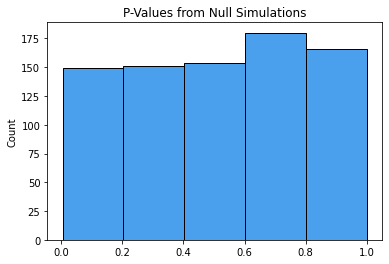

In [91]:
df_sim_sig_5_diff_0_0_spotwise_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.all_HSP90AB1.sigma.10.cs.0_0.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_0_spotwise_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.all_RPS10.sigma.10.cs.0_0.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_0_spotwise_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.all_S100A13.sigma.10.cs.0_0.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_0_spotwise_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.all_ILF2.sigma.10.cs.0_0.condition.mult_clusts.per_clust_stats.tsv'), 
    sep='\t', index_col=0
)

all_pvals = list(df_sim_sig_5_diff_0_0_spotwise_HSP90AB1['p_value']) \
    + list(df_sim_sig_5_diff_0_0_spotwise_RPS10['p_value']) \
    + list(df_sim_sig_5_diff_0_0_spotwise_S100A13['p_value']) \
    + list(df_sim_sig_5_diff_0_0_spotwise_ILF2['p_value'])
fpr = len([x for x in all_pvals if x < 0.05]) / len(all_pvals)
print("False positive rate: ", fpr)

sns.histplot(all_pvals, bins=5, color='#0D80E7')
plt.title("P-Values from Null Simulations")
plt.show()

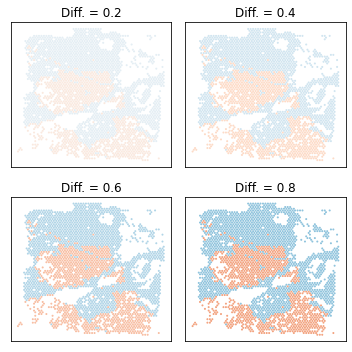

In [66]:
figure, axarr = plt.subplots(
    2,
    2,
    figsize = (5,5)
)

spatialcorr.plot_slide(
    df_sim_data_diff_0_2_RPS10,
    df_sim_data_diff_0_2_RPS10['correlation'],
    cmap='RdBu_r',
    colorbar=False,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.2',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[0][0],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_diff_0_4_RPS10,
    df_sim_data_diff_0_4_RPS10['correlation'],
    cmap='RdBu_r',
    colorbar=False,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.4',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[0][1],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_diff_0_6_RPS10, 
    df_sim_data_diff_0_6_RPS10['correlation'], 
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.6',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[1][0]
)

spatialcorr.plot_slide(
    df_sim_data_diff_0_8_RPS10, 
    df_sim_data_diff_0_8_RPS10['correlation'], 
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.8',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[1][1]
)
#axarr[1][1].set_visible(False)

plt.tight_layout()
figure.savefig(join(DATA_ROOT, 'figures/BHR_example_data_static_means_V2.pdf'), format='pdf')

plt.show()

In [17]:
#MT-CYB
#HSP90AB1
#RPS10
#S100A13
#ILF2
#NDUFS8

# Rank 50
df_sim_sig_5_diff_0_2_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.HSP90AB1.corr_diff.0_2.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_4_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.HSP90AB1.corr_diff.0_4.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_6_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.HSP90AB1.corr_diff.0_6.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_8_HSP90AB1 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.HSP90AB1.corr_diff.0_8.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)

# Rank 100
df_sim_sig_5_diff_0_2_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.RPS10.corr_diff.0_2.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_4_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.RPS10.corr_diff.0_4.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_6_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.RPS10.corr_diff.0_6.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_8_RPS10 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.RPS10.corr_diff.0_8.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)

# Rank 200
df_sim_sig_5_diff_0_2_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.S100A13.corr_diff.0_2.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_4_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.S100A13.corr_diff.0_4.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_6_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.S100A13.corr_diff.0_6.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_8_S100A13 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.S100A13.corr_diff.0_8.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)

# Rank 400
df_sim_sig_5_diff_0_2_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.ILF2.corr_diff.0_2.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_4_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.ILF2.corr_diff.0_4.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_6_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.ILF2.corr_diff.0_6.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_8_ILF2 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.ILF2.corr_diff.0_8.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)

# Rank 800
df_sim_sig_5_diff_0_2_NDUFS8 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.NDUFS8.corr_diff.0_2.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_4_NDUFS8 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.NDUFS8.corr_diff.0_4.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_6_NDUFS8 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.NDUFS8.corr_diff.0_6.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)
df_sim_sig_5_diff_0_8_NDUFS8 = pd.read_csv(
    join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-gene.NDUFS8.corr_diff.0_8.condition.mult_clusts.tsv'), 
    sep='\t', index_col=0
)

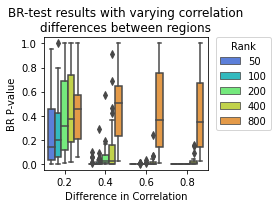

In [60]:
X_LABEL = 'Difference in Correlation'

da = [
    (p_val, '0.2', '50')
    for p_val in df_sim_sig_5_diff_0_2_HSP90AB1['p_value']
]
da += [
    (p_val, '0.4', '50')
    for p_val in df_sim_sig_5_diff_0_4_HSP90AB1['p_value']
]
da += [
    (p_val, '0.6', '50')
    for p_val in df_sim_sig_5_diff_0_6_HSP90AB1['p_value']
]
da += [
    (p_val, '0.8', '50')
    for p_val in df_sim_sig_5_diff_0_8_HSP90AB1['p_value']
]


da += [
    (p_val, '0.2', '100')
    for p_val in df_sim_sig_5_diff_0_2_RPS10['p_value']
]
da += [
    (p_val, '0.4', '100')
    for p_val in df_sim_sig_5_diff_0_4_RPS10['p_value']
]
da += [
    (p_val, '0.6', '100')
    for p_val in df_sim_sig_5_diff_0_6_RPS10['p_value']
]
da += [
    (p_val, '0.8', '100')
    for p_val in df_sim_sig_5_diff_0_8_RPS10['p_value']
]

da += [
    (p_val, '0.2', '200')
    for p_val in df_sim_sig_5_diff_0_2_S100A13['p_value']
]
da += [
    (p_val, '0.4', '200')
    for p_val in df_sim_sig_5_diff_0_4_S100A13['p_value']
]
da += [
    (p_val, '0.6', '200')
    for p_val in df_sim_sig_5_diff_0_6_S100A13['p_value']
]
da += [
    (p_val, '0.8', '200')
    for p_val in df_sim_sig_5_diff_0_8_S100A13['p_value']
]

da += [
    (p_val, '0.2', '400')
    for p_val in df_sim_sig_5_diff_0_2_ILF2['p_value']
]
da += [
    (p_val, '0.4', '400')
    for p_val in df_sim_sig_5_diff_0_4_ILF2['p_value']
]
da += [
    (p_val, '0.6', '400')
    for p_val in df_sim_sig_5_diff_0_6_ILF2['p_value']
]
da += [
    (p_val, '0.8', '400')
    for p_val in df_sim_sig_5_diff_0_8_ILF2['p_value']
]

da += [
    (p_val, '0.2', '800')
    for p_val in df_sim_sig_5_diff_0_2_NDUFS8['p_value']
]
da += [
    (p_val, '0.4', '800')
    for p_val in df_sim_sig_5_diff_0_4_NDUFS8['p_value']
]
da += [
    (p_val, '0.6', '800')
    for p_val in df_sim_sig_5_diff_0_6_NDUFS8['p_value']
]
da += [
    (p_val, '0.8', '800')
    for p_val in df_sim_sig_5_diff_0_8_NDUFS8['p_value']
]

plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', X_LABEL, 'Simulated Expression']
)

fig, ax = plt.subplots(
    1,
    1,
    figsize=(4,3)
)
sns.set_palette(sns.color_palette("turbo"))
sns.boxplot(data=plot_df, x=X_LABEL, y='P-value', hue='Simulated Expression', ax=ax)
#sns.stripplot(data=plot_df, x='Covariance Strength', y='P-value', hue='Simulated Expression', color='black')
#plt.show()



ax.set_title('BR-test results with varying correlation\ndifferences between regions')
ax.set_ylabel('BR P-value')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., title="Rank")
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/distr_p_vals_high_low_diff_change_cov_diff_between_regions.pdf'), format='pdf')


sns.set_palette("Set2")

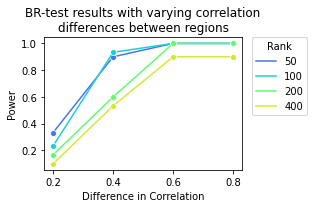

In [67]:
X_LABEL = "Difference in Correlation"

da = []
fdr = len([x for x in df_sim_sig_5_diff_0_2_HSP90AB1['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_2_HSP90AB1['p_value'])
da.append([fdr, '0.2', '50'])
fdr = len([x for x in df_sim_sig_5_diff_0_4_HSP90AB1['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_4_HSP90AB1['p_value'])
da.append([fdr, '0.4', '50'])
fdr = len([x for x in df_sim_sig_5_diff_0_6_HSP90AB1['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_6_HSP90AB1['p_value'])
da.append([fdr, '0.6', '50'])
fdr = len([x for x in df_sim_sig_5_diff_0_8_HSP90AB1['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_8_HSP90AB1['p_value'])
da.append([fdr, '0.8', '50'])

fdr = len([x for x in df_sim_sig_5_diff_0_2_RPS10['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_2_RPS10['p_value'])
da.append([fdr, '0.2', '100'])
fdr = len([x for x in df_sim_sig_5_diff_0_4_RPS10['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_4_RPS10['p_value'])
da.append([fdr, '0.4', '100'])
fdr = len([x for x in df_sim_sig_5_diff_0_6_RPS10['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_6_RPS10['p_value'])
da.append([fdr, '0.6', '100'])
fdr = len([x for x in df_sim_sig_5_diff_0_8_RPS10['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_8_RPS10['p_value'])
da.append([fdr, '0.8', '100'])

fdr = len([x for x in df_sim_sig_5_diff_0_2_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_2_S100A13['p_value'])
da.append([fdr, '0.2', '200'])
fdr = len([x for x in df_sim_sig_5_diff_0_4_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_4_S100A13['p_value'])
da.append([fdr, '0.4', '200'])
fdr = len([x for x in df_sim_sig_5_diff_0_6_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_6_S100A13['p_value'])
da.append([fdr, '0.6', '200'])
fdr = len([x for x in df_sim_sig_5_diff_0_8_S100A13['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_8_S100A13['p_value'])
da.append([fdr, '0.8', '200'])

fdr = len([x for x in df_sim_sig_5_diff_0_2_ILF2['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_2_ILF2['p_value'])
da.append([fdr, '0.2', '400'])
fdr = len([x for x in df_sim_sig_5_diff_0_4_ILF2['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_4_ILF2['p_value'])
da.append([fdr, '0.4', '400'])
fdr = len([x for x in df_sim_sig_5_diff_0_6_ILF2['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_6_ILF2['p_value'])
da.append([fdr, '0.6', '400'])
fdr = len([x for x in df_sim_sig_5_diff_0_8_ILF2['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_8_ILF2['p_value'])
da.append([fdr, '0.8', '400'])


#fdr = len([x for x in df_sim_sig_5_diff_0_2_NDUFS8['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_2_NDUFS8['p_value'])
#da.append([fdr, '0.2', '800'])
#fdr = len([x for x in df_sim_sig_5_diff_0_4_NDUFS8['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_4_NDUFS8['p_value'])
#da.append([fdr, '0.4', '800'])
#fdr = len([x for x in df_sim_sig_5_diff_0_6_NDUFS8['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_6_NDUFS8['p_value'])
#da.append([fdr, '0.6', '800'])
#fdr = len([x for x in df_sim_sig_5_diff_0_8_NDUFS8['p_value'] if x < P_VAL_THRESH]) / len(df_sim_sig_5_diff_0_8_NDUFS8['p_value'])
#da.append([fdr, '0.8', '800'])

plot_df = pd.DataFrame(
    data=da,
    columns=['Power', X_LABEL, 'Simulated Expression']
)

fig, ax = plt.subplots(
    1,
    1,
    figsize=(4.5,3)
)
sns.set_palette(sns.color_palette("turbo"))
sns.lineplot(data=plot_df, x=X_LABEL, y='Power', hue='Simulated Expression', marker='o', ax=ax)
#sns.stripplot(data=plot_df, x='Covariance Strength', y='P-value', hue='Simulated Expression', color='black')
#plt.show()



ax.set_title('BR-test results with varying correlation\ndifferences between regions')
ax.set_ylabel('Power')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., title="Rank")
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/power_high_low_diff_change_cov_diff_between_regions.pdf'), format='pdf')

sns.set_palette("Set2")

# Multiple genes

In [21]:
# Rank 50
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.2.gene.HSP90AB1.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_2_HSP90AB1 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.4.gene.HSP90AB1.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_4_HSP90AB1 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.6.gene.HSP90AB1.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_6_HSP90AB1 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.8.gene.HSP90AB1.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_8_HSP90AB1 = json.load(f)
    
# Rank 100
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.2.gene.RPS10.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_2_RPS10 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.4.gene.RPS10.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_4_RPS10 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.6.gene.RPS10.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_6_RPS10 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.8.gene.RPS10.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_8_RPS10 = json.load(f)
    
# Rank 200
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.2.gene.S100A13.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_2_S100A13 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.4.gene.S100A13.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_4_S100A13 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.6.gene.S100A13.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_6_S100A13 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.8.gene.S100A13.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_8_S100A13 = json.load(f)
    
# Rank 400
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.2.gene.ILF2.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_2_ILF2 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.4.gene.ILF2.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_4_ILF2 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.6.gene.ILF2.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_6_ILF2 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.8.gene.ILF2.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_8_ILF2 = json.load(f)
    
# Rank 800
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.2.gene.NDUFS8.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_2_NDUFS8 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.4.gene.NDUFS8.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_4_NDUFS8 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.6.gene.NDUFS8.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_6_NDUFS8 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.within.features.dino-mg.8.gene.NDUFS8.cs.0_01.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_cs_0_1_mg_8_NDUFS8 = json.load(f)

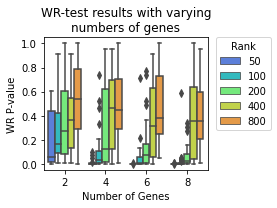

In [72]:
X_LABEL = 'Number of Genes'

da = [
    (p_val, '2', '50')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_2_HSP90AB1.values()]
]
da += [
    (p_val, '4', '50')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_4_HSP90AB1.values()]
]
da += [
    (p_val, '6', '50')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_6_HSP90AB1.values()]
]
da += [
    (p_val, '8', '50')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_8_HSP90AB1.values()]
]

da += [
    (p_val, '2', '100')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_2_RPS10.values()]
]
da += [
    (p_val, '4', '100')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_4_RPS10.values()]
]
da += [
    (p_val, '6', '100')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_6_RPS10.values()]
]
da += [
    (p_val, '8', '100')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_8_RPS10.values()]
]

da += [
    (p_val, '2', '200')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_2_S100A13.values()]
]
da += [
    (p_val, '4', '200')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_4_S100A13.values()]
]
da += [
    (p_val, '6', '200')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_6_S100A13.values()]
]
da += [
    (p_val, '8', '200')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_8_S100A13.values()]
]

da += [
    (p_val, '2', '400')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_2_ILF2.values()]
]
da += [
    (p_val, '4', '400')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_4_ILF2.values()]
]
da += [
    (p_val, '6', '400')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_6_ILF2.values()]
]
da += [
    (p_val, '8', '400')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_8_ILF2.values()]
]

da += [
    (p_val, '2', '800')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_2_NDUFS8.values()]
]
da += [
    (p_val, '4', '800')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_4_NDUFS8.values()]
]
da += [
    (p_val, '6', '800')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_6_NDUFS8.values()]
]
da += [
    (p_val, '8', '800')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_8_NDUFS8.values()]
]

plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', X_LABEL, 'Simulated Expression']
)

fig, ax = plt.subplots(
    1,
    1,
    figsize=(4,3)
)
sns.set_palette(sns.color_palette("turbo"))
sns.boxplot(data=plot_df, x=X_LABEL, y='P-value', hue='Simulated Expression', ax=ax)
#sns.stripplot(data=plot_df, x='Covariance Strength', y='P-value', hue='Simulated Expression', color='black')
#plt.show()



ax.set_title('WR-test results with varying\nnumbers of genes')
ax.set_ylabel('WR P-value')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., title="Rank")
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/distr_p_vals_change_num_genes_within_regions.pdf'), format='pdf')

sns.set_palette("Set2")

       Power Number of Genes Simulated Expression
0   0.466667               2                   50
1   0.900000               4                   50
2   1.000000               6                   50
3   1.000000               8                   50
4   0.166667               2                  100
5   0.533333               4                  100
6   0.733333               6                  100
7   0.966667               8                  100
8   0.200000               2                  200
9   0.400000               4                  200
10  0.466667               6                  200
11  0.666667               8                  200
12  0.166667               2                  400
13  0.166667               4                  400
14  0.266667               6                  400
15  0.266667               8                  400


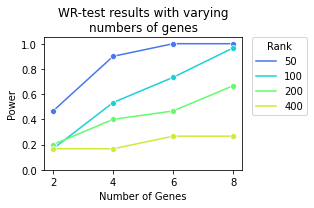

In [77]:
X_LABEL = 'Number of Genes'

da = []

fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_2_HSP90AB1.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_2_HSP90AB1.values()])
da.append([fdr, '2', '50'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_4_HSP90AB1.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_4_HSP90AB1.values()])
da.append([fdr, '4', '50'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_6_HSP90AB1.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_6_HSP90AB1.values()])
da.append([fdr, '6', '50'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_8_HSP90AB1.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_8_HSP90AB1.values()])
da.append([fdr, '8', '50'])

fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_2_RPS10.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_2_RPS10.values()])
da.append([fdr, '2', '100'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_4_RPS10.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_4_RPS10.values()])
da.append([fdr, '4', '100'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_6_RPS10.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_6_RPS10.values()])
da.append([fdr, '6', '100'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_8_RPS10.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_8_RPS10.values()])
da.append([fdr, '8', '100'])

fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_2_S100A13.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_2_S100A13.values()])
da.append([fdr, '2', '200'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_4_S100A13.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_4_S100A13.values()])
da.append([fdr, '4', '200'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_6_S100A13.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_6_S100A13.values()])
da.append([fdr, '6', '200'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_8_S100A13.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_8_S100A13.values()])
da.append([fdr, '8', '200'])

fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_2_ILF2.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_2_ILF2.values()])
da.append([fdr, '2', '400'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_4_ILF2.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_4_ILF2.values()])
da.append([fdr, '4', '400'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_6_ILF2.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_6_ILF2.values()])
da.append([fdr, '6', '400'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_8_ILF2.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_8_ILF2.values()])
da.append([fdr, '8', '400'])

#fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_2_NDUFS8.values()] if p < P_VAL_THRESH]) \
#     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_2_NDUFS8.values()])
#da.append([fdr, '2', '800'])
#fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_4_NDUFS8.values()] if p < P_VAL_THRESH]) \
#     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_4_NDUFS8.values()])
#da.append([fdr, '4', '800'])
#fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_6_NDUFS8.values()] if p < P_VAL_THRESH]) \
#     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_6_NDUFS8.values()])
#da.append([fdr, '6', '800'])
#fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_8_NDUFS8.values()] if p < P_VAL_THRESH]) \
#     / len([x['joint_p_value'] for x in j_sim_sig_5_cs_0_1_mg_8_NDUFS8.values()])
#da.append([fdr, '8', '800'])
#


plot_df = pd.DataFrame(
    data=da,
    columns=['Power', X_LABEL, 'Simulated Expression']
)
print(plot_df)

fig, ax = plt.subplots(
    1,
    1,
    figsize=(4.5,3)
)
sns.set_palette(sns.color_palette("turbo"))
sns.lineplot(data=plot_df, x=X_LABEL, y='Power', hue='Simulated Expression', marker='o', ax=ax)
#sns.stripplot(data=plot_df, x='Covariance Strength', y='P-value', hue='Simulated Expression', color='black')
#plt.show()

ax.set_title('WR-test results with varying\nnumbers of genes')
ax.set_ylabel('Power')
ax.set_ylim((0,1.05))
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., title="Rank")
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/power_change_num_genes_within_regions.pdf'), format='pdf')

sns.set_palette("Set2")

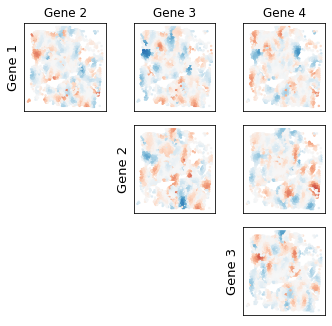

In [85]:
df_sim_data_mult_genes_9_RPS10_cs_0_0125 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets/mg_9.gene_RPS10.sigma_10.cs_0.01/1.tsv'),
    sep='\t', index_col=0
)

all_sim_corrs = [
    eval(row['correlation'])
    for r_i, row in df_sim_data_mult_genes_9_RPS10_cs_0_0125.iterrows()
]

sim_index = 0

fig, axarr = plt.subplots(
    4,
    4,
    figsize=(6,6)
)
for row, ax_row in enumerate(axarr):
    for col, ax in enumerate(ax_row):
        corrs = [
            x[row][col]
            for x in all_sim_corrs
        ]
        if col > row:
            if row == 0:
                title = f'Gene {col+1}'
            else: 
                title = None
                
            if col == row+1:
                ax.set_ylabel(f'Gene {row+1}', fontsize=13)
            spatialcorr.plot_slide(
                df_sim_data_mult_genes_9_RPS10_cs_0_0125, 
                corrs, 
                cmap='RdBu_r', 
                colorbar=False, 
                vmin=-1, 
                vmax=1, 
                title=title, 
                ax=ax, 
                figure=fig,
                ticks=False, 
                dsize=2,
                row_key='row',
                col_key='col'
            )
        else:
            ax.set_visible(False)
        
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/mult_genes_example_data.pdf'), format='pdf')
plt.show()



### Multiple genes BR-test

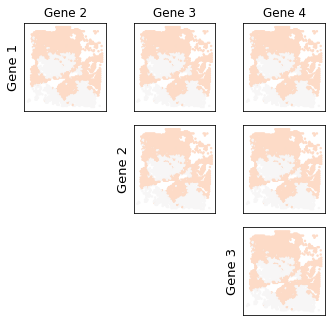

In [83]:
df_sim_data_mult_genes_9_RPS10_diff_0_2 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets/mg_9.gene_RPS10.diff_0.2/0.tsv'),
    sep='\t', index_col=0
)

all_sim_corrs = [
    eval(row['correlation'])
    for r_i, row in df_sim_data_mult_genes_9_RPS10_diff_0_2.iterrows()
]

sim_index = 0

fig, axarr = plt.subplots(
    4,
    4,
    figsize=(6,6)
)
for row, ax_row in enumerate(axarr):
    for col, ax in enumerate(ax_row):
        corrs = [
            x[row][col]
            for x in all_sim_corrs
        ]
        if col > row:
            if row == 0:
                title = f'Gene {col+1}'
            else: 
                title = None
                
            if col == row+1:
                ax.set_ylabel(f'Gene {row+1}', fontsize=13)
            spatialcorr.plot_slide(
                df_sim_data_mult_genes_9_RPS10_diff_0_2, 
                corrs, 
                cmap='RdBu_r', 
                colorbar=False, 
                vmin=-1, 
                vmax=1, 
                title=title, 
                ax=ax, 
                figure=fig,
                ticks=False, 
                dsize=2,
                row_key='row',
                col_key='col'
            )
        else:
            ax.set_visible(False)
        
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/mult_genes_example_data_between.pdf'), format='pdf')
plt.show()


 


In [35]:
# Rank 50
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.2.gene.HSP90AB1.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_2_HSP90AB1 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.4.gene.HSP90AB1.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_4_HSP90AB1 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.6.gene.HSP90AB1.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_6_HSP90AB1 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.8.gene.HSP90AB1.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_8_HSP90AB1 = json.load(f)
    
# Rank 100
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.2.gene.RPS10.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_2_RPS10 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.4.gene.RPS10.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_4_RPS10 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.6.gene.RPS10.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_6_RPS10 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.8.gene.RPS10.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_8_RPS10 = json.load(f)
    
# Rank 200
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.2.gene.S100A13.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_2_S100A13 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.4.gene.S100A13.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_4_S100A13 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.6.gene.S100A13.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_6_S100A13 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.8.gene.S100A13.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_8_S100A13 = json.load(f)

# Rank 400
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.2.gene.ILF2.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_2_ILF2 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.4.gene.ILF2.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_4_ILF2 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.6.gene.ILF2.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_6_ILF2 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.8.gene.ILF2.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_8_ILF2 = json.load(f)
    
# Rank 800
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.2.gene.NDUFS8.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_2_NDUFS8 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.4.gene.NDUFS8.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_4_NDUFS8 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.6.gene.NDUFS8.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_6_NDUFS8 = json.load(f)
with open(join(DATA_ROOT, 'spatialcorr_results/sigma.5.condition.mult_clusts.test.between.features.dino-mg.8.gene.NDUFS8.diff.0_2.condition.mult_clusts.tsv'), 'r') as f:
    j_sim_sig_5_diff_0_2_mg_8_NDUFS8 = json.load(f)




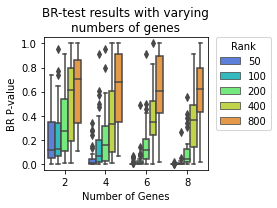

In [81]:
X_LABEL = 'Number of Genes'

da = [
    (p_val, '2', '50')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_2_HSP90AB1.values()]
]
da += [
    (p_val, '4', '50')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_4_HSP90AB1.values()]
]
da += [
    (p_val, '6', '50')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_6_HSP90AB1.values()]
]
da += [
    (p_val, '8', '50')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_8_HSP90AB1.values()]
]

da += [
    (p_val, '2', '100')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_2_RPS10.values()]
]
da += [
    (p_val, '4', '100')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_4_RPS10.values()]
]
da += [
    (p_val, '6', '100')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_6_RPS10.values()]
]
da += [
    (p_val, '8', '100')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_8_RPS10.values()]
]

da += [
    (p_val, '2', '200')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_2_S100A13.values()]
]
da += [
    (p_val, '4', '200')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_4_S100A13.values()]
]
da += [
    (p_val, '6', '200')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_6_S100A13.values()]
]
da += [
    (p_val, '8', '200')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_8_S100A13.values()]
]

da += [
    (p_val, '2', '400')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_2_ILF2.values()]
]
da += [
    (p_val, '4', '400')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_4_ILF2.values()]
]
da += [
    (p_val, '6', '400')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_6_ILF2.values()]
]
da += [
    (p_val, '8', '400')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_8_ILF2.values()]
]

da += [
    (p_val, '2', '800')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_2_NDUFS8.values()]
]
da += [
    (p_val, '4', '800')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_4_NDUFS8.values()]
]
da += [
    (p_val, '6', '800')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_6_NDUFS8.values()]
]
da += [
    (p_val, '8', '800')
    for p_val in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_8_NDUFS8.values()]
]



plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', X_LABEL, 'Simulated Expression']
)

fig, ax = plt.subplots(
    1,
    1,
    figsize=(4,3)
)
sns.set_palette(sns.color_palette("turbo"))
sns.boxplot(data=plot_df, x=X_LABEL, y='P-value', hue='Simulated Expression', ax=ax)
#sns.stripplot(data=plot_df, x='Covariance Strength', y='P-value', hue='Simulated Expression', color='black')
#plt.show()



ax.set_title('BR-test results with varying\nnumbers of genes')
ax.set_ylabel('BR P-value')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., title="Rank")
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/distr_p_vals_change_num_genes_between_regions.pdf'), format='pdf')

sns.set_palette("Set2")

       Power Number of Genes Simulated Expression
0   0.233333               2                   50
1   0.766667               4                   50
2   0.933333               6                   50
3   1.000000               8                   50
4   0.200000               2                  100
5   0.433333               4                  100
6   0.833333               6                  100
7   0.966667               8                  100
8   0.066667               2                  200
9   0.366667               4                  200
10  0.300000               6                  200
11  0.533333               8                  200
12  0.100000               2                  400
13  0.066667               4                  400
14  0.100000               6                  400
15  0.133333               8                  400


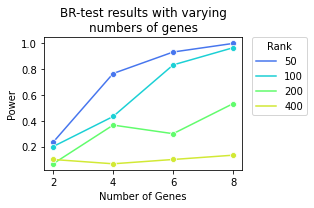

In [78]:
X_LABEL = 'Number of Genes'

da = []

fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_2_HSP90AB1.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_2_HSP90AB1.values()])
da.append([fdr, '2', '50'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_4_HSP90AB1.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_4_HSP90AB1.values()])
da.append([fdr, '4', '50'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_6_HSP90AB1.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_6_HSP90AB1.values()])
da.append([fdr, '6', '50'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_8_HSP90AB1.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_8_HSP90AB1.values()])
da.append([fdr, '8', '50'])

fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_2_RPS10.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_2_RPS10.values()])
da.append([fdr, '2', '100'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_4_RPS10.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_4_RPS10.values()])
da.append([fdr, '4', '100'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_6_RPS10.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_6_RPS10.values()])
da.append([fdr, '6', '100'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_8_RPS10.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_8_RPS10.values()])
da.append([fdr, '8', '100'])

fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_2_S100A13.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_2_S100A13.values()])
da.append([fdr, '2', '200'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_4_S100A13.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_4_S100A13.values()])
da.append([fdr, '4', '200'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_6_S100A13.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_6_S100A13.values()])
da.append([fdr, '6', '200'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_8_S100A13.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_8_S100A13.values()])
da.append([fdr, '8', '200'])

fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_2_ILF2.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_2_ILF2.values()])
da.append([fdr, '2', '400'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_4_ILF2.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_4_ILF2.values()])
da.append([fdr, '4', '400'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_6_ILF2.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_6_ILF2.values()])
da.append([fdr, '6', '400'])
fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_8_ILF2.values()] if p < P_VAL_THRESH]) \
     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_8_ILF2.values()])
da.append([fdr, '8', '400'])

#fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_2_NDUFS8.values()] if p < P_VAL_THRESH]) \
#     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_2_NDUFS8.values()])
#da.append([fdr, '2', '800'])
#fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_4_NDUFS8.values()] if p < P_VAL_THRESH]) \
#     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_4_NDUFS8.values()])
#da.append([fdr, '4', '800'])
#fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_6_NDUFS8.values()] if p < P_VAL_THRESH]) \
#     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_6_NDUFS8.values()])
#da.append([fdr, '6', '800'])
#fdr = len([p for p in [x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_8_NDUFS8.values()] if p < P_VAL_THRESH]) \
#     / len([x['joint_p_value'] for x in j_sim_sig_5_diff_0_2_mg_8_NDUFS8.values()])
#da.append([fdr, '8', '800'])


plot_df = pd.DataFrame(
    data=da,
    columns=['Power', X_LABEL, 'Simulated Expression']
)
print(plot_df)

fig, ax = plt.subplots(
    1,
    1,
    figsize=(4.5,3)
)
sns.set_palette(sns.color_palette("turbo"))
sns.lineplot(data=plot_df, x=X_LABEL, y='Power', hue='Simulated Expression', marker='o', ax=ax)
#sns.stripplot(data=plot_df, x='Covariance Strength', y='P-value', hue='Simulated Expression', color='black')
#plt.show()



ax.set_title('BR-test results with varying\nnumbers of genes')
ax.set_ylabel('Power')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., title="Rank")
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/power_change_num_genes_between_regions.pdf'), format='pdf')

sns.set_palette("Set2")

### Mean expression different between clusters, static correlation across slide

We'll see how the test does when we condition on cluster versus when we don't. We expect conditioning to help mitigate the problem of differing means leading to artificial false positives.

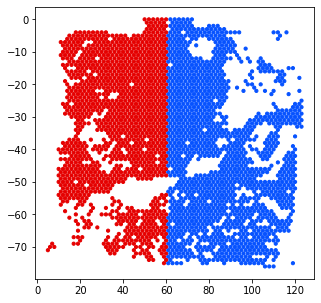

Counts


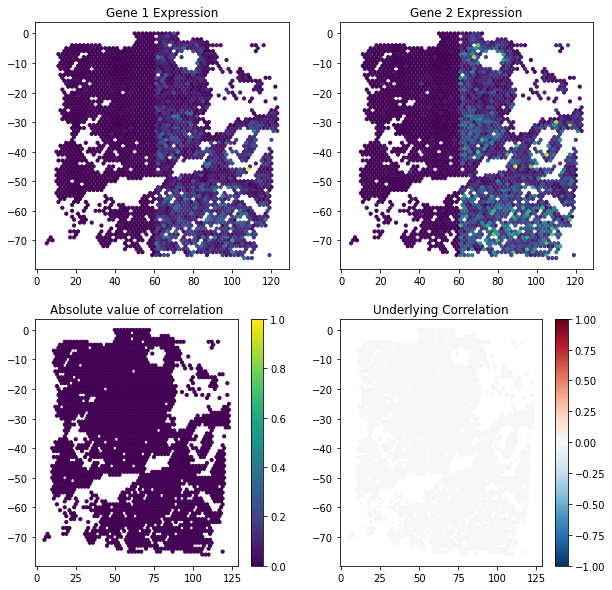

Deviance residuals


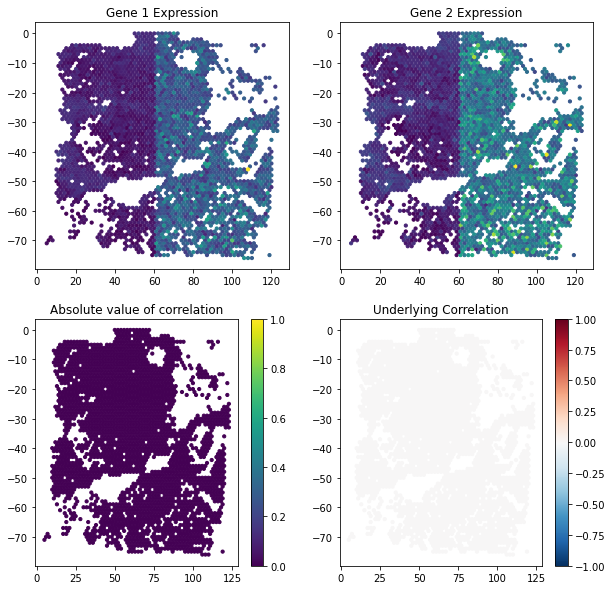

Dino


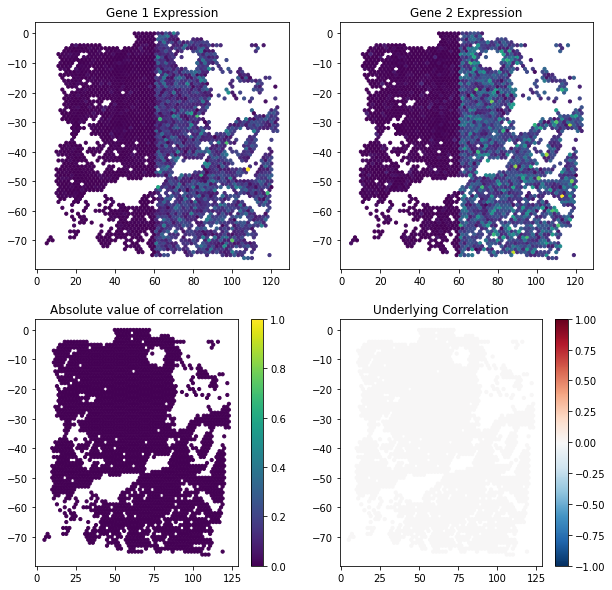

Deviance residuals. Cluster 1.


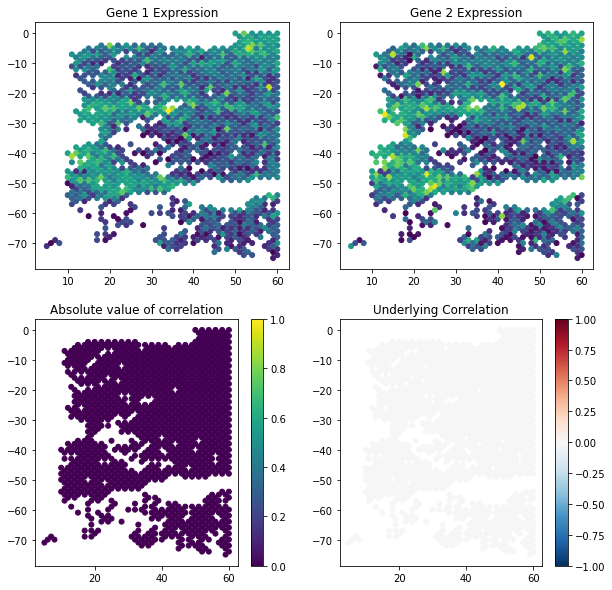

Dino. Cluster 1


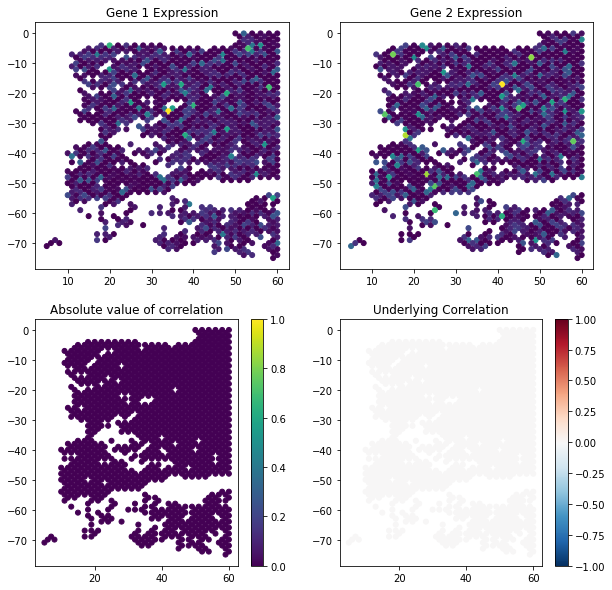

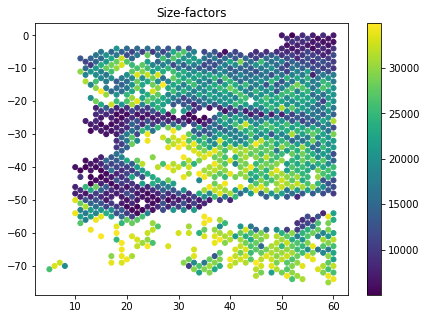

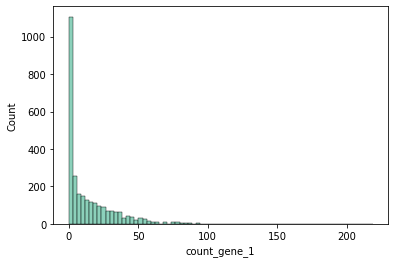

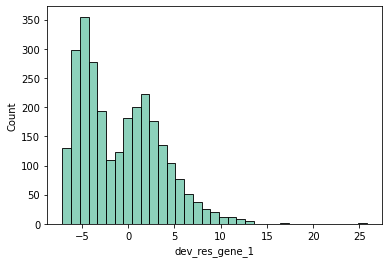

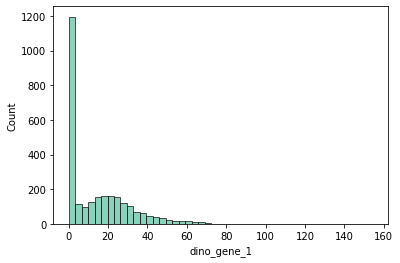

Examine effect of size-factors


/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


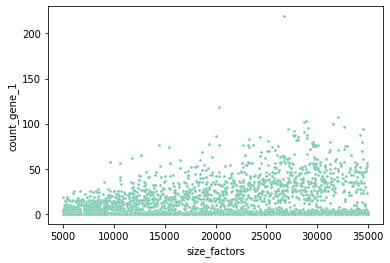

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


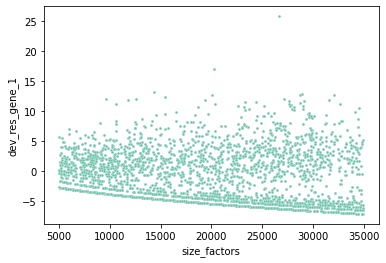

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


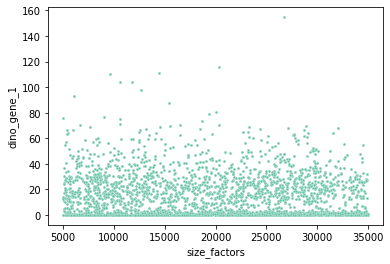

In [25]:
df_sim_data_diff_means_cs_0_0_spotwise_v2 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino', 'config_static.corr.differ.means.2/0.tsv'),
    sep='\t', index_col=0
)


spatialcorr.plot_slide(
    df_sim_data_diff_means_cs_0_0_spotwise_v2, 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'], 
    cmap='categorical',
    colorbar=False,
    #title='Counts',
    row_key='row',
    col_key='col',
    dsize=10
)
plt.show()

print("Counts")
simulate_data.plot_simulated_data(
    df_sim_data_diff_means_cs_0_0_spotwise_v2, 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['count_gene_1'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['count_gene_2'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['correlation'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Deviance residuals")
simulate_data.plot_simulated_data(
    df_sim_data_diff_means_cs_0_0_spotwise_v2, 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['dev_res_gene_1'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['dev_res_gene_2'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['correlation'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Dino")
simulate_data.plot_simulated_data(
    df_sim_data_diff_means_cs_0_0_spotwise_v2, 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['dino_gene_1'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['dino_gene_2'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['correlation'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

print("Deviance residuals. Cluster 1.")
simulate_data.plot_simulated_data(
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['dev_res_gene_1'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['dev_res_gene_2'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['correlation'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=25
)
plt.show()

print("Dino. Cluster 1")
simulate_data.plot_simulated_data(
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['dino_gene_1'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['dino_gene_2'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['correlation'], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=25
)
plt.show()

spatialcorr.plot_slide(
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1], 
    df_sim_data_diff_means_cs_0_0_spotwise_v2.loc[df_sim_data_diff_means_cs_0_0_spotwise_v2['cluster'] == 1]['size_factors'], 
    cmap='viridis',
    colorbar=True,
    title='Size-factors',
    dsize=25
)
plt.show()

sns.histplot(df_sim_data_diff_means_cs_0_0_spotwise_v2['count_gene_1'])
plt.show()

sns.histplot(df_sim_data_diff_means_cs_0_0_spotwise_v2['dev_res_gene_1'])
plt.show()

sns.histplot(df_sim_data_diff_means_cs_0_0_spotwise_v2['dino_gene_1'])
plt.show()

print("Examine effect of size-factors")
sns.scatterplot(
    df_sim_data_diff_means_cs_0_0_spotwise_v2['size_factors'],
    df_sim_data_diff_means_cs_0_0_spotwise_v2['count_gene_1'],
    s=8
)
plt.show()

sns.scatterplot(
    df_sim_data_diff_means_cs_0_0_spotwise_v2['size_factors'],
    df_sim_data_diff_means_cs_0_0_spotwise_v2['dev_res_gene_1'],
    s=8
)
plt.show()

sns.scatterplot(
    df_sim_data_diff_means_cs_0_0_spotwise_v2['size_factors'],
    df_sim_data_diff_means_cs_0_0_spotwise_v2['dino_gene_1'],
    s=8
)
plt.show()

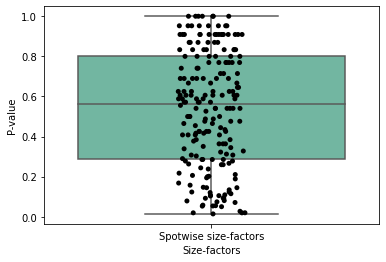

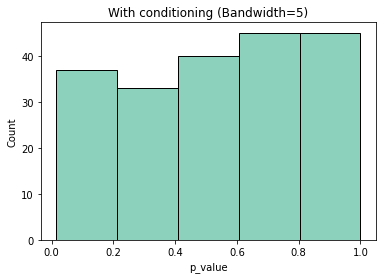

In [26]:
# Spotwise size-factors
sns.set_palette('Set2')
df_sim_diff_means_cs_0_0_spotwise_condition_v2 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_within_dino-config_static.corr.differ.means.2.tsv'), 
    sep='\t', index_col=0
)
da = [
    (p_val, 'Spotwise size-factors')
    for p_val in df_sim_diff_means_cs_0_0_spotwise_condition_v2['p_value']
]
plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', 'Size-factors']
)
sns.boxplot(data=plot_df, x='Size-factors', y='P-value')
sns.stripplot(data=plot_df, x='Size-factors', y='P-value', color='black')
plt.show()

sns.histplot(df_sim_diff_means_cs_0_0_spotwise_condition_v2['p_value'], bins=5)
plt.title('With conditioning (Bandwidth=5)')
plt.show()

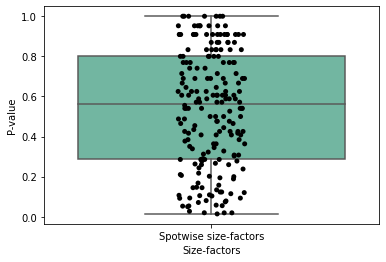

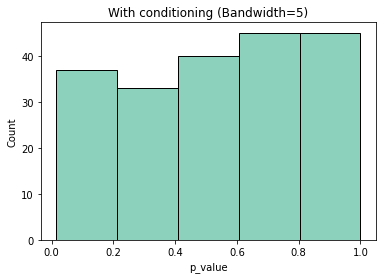

In [27]:
# Spotwise size-factors
df_sim_diff_means_cs_0_0_spotwise_condition_v2 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_within_dino-config_static.corr.differ.means.2.tsv'), 
    sep='\t', index_col=0
)
da = [
    (p_val, 'Spotwise size-factors')
    for p_val in df_sim_diff_means_cs_0_0_spotwise_condition_v2['p_value']
]
plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', 'Size-factors']
)
sns.boxplot(data=plot_df, x='Size-factors', y='P-value')
sns.stripplot(data=plot_df, x='Size-factors', y='P-value', color='black')
plt.show()

sns.histplot(df_sim_diff_means_cs_0_0_spotwise_condition_v2['p_value'], bins=5)
plt.title('With conditioning (Bandwidth=5)')
plt.show()

## Examine the between-clusters test results

#### Examine the results on some null datasets in which there is no difference in correlation between groups. Moreover, there is no difference in means.

In [58]:
df_sim_static_means_CALML5_corr_between_0_0_spotwise = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_between_dino-config_differ.corr_between_0_0.static.means_CALML5.spotwise.tsv'),
    sep='\t', index_col=0
)

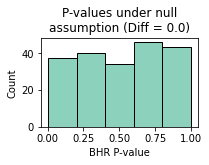

In [59]:
fig, ax = plt.subplots(
    1,
    1,
    figsize = (3,2.4)
)
sns.histplot(df_sim_static_means_CALML5_corr_between_0_0_spotwise['p_value'], bins=5, ax=ax)
ax.set_xlabel('BHR P-value')
plt.title('P-values under null\nassumption (Diff = 0.0)')

plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/distr_p_vals_null_BHR_static_means.pdf'), format='pdf')

#### Now start increasing the difference in the correlation between groups. Note, there is no difference in their means

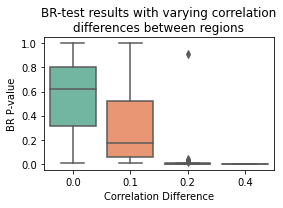

In [66]:
df_sim_static_means_cs_0_0_spotwise_test_between_diff_corr_0_1 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_between_dino-config_differ.corr_between_0_1.static.means_CALML5.tsv'),
    sep='\t', index_col=0
)
df_sim_static_means_cs_0_0_spotwise_test_between_diff_corr_0_2 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_between_dino-config_differ.corr_between_0_2.static.means_CALML5.tsv'),
    sep='\t', index_col=0
)
df_sim_static_means_cs_0_0_spotwise_test_between_diff_corr_0_4 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_between_dino-config_differ.corr_between_0_4.static.means_CALML5.tsv'),
    sep='\t', index_col=0
)

da = [ 
    (p_val, '0.0')
    for p_val in df_sim_static_means_CALML5_corr_between_0_0_spotwise['p_value'][:30]
]
da += [
    (p_val, '0.1')
    for p_val in df_sim_static_means_cs_0_0_spotwise_test_between_diff_corr_0_1['p_value']
]
da += [
    (p_val, '0.2')
    for p_val in df_sim_static_means_cs_0_0_spotwise_test_between_diff_corr_0_2['p_value']
]
da += [
    (p_val, '0.4')
    for p_val in df_sim_static_means_cs_0_0_spotwise_test_between_diff_corr_0_4['p_value']
]
plot_df = pd.DataFrame(
    data=da,
    columns=['BR P-value', 'Correlation Difference']
)



fig, ax = plt.subplots(
    1,
    1,
    figsize=(4,3)
)
sns.boxplot(data=plot_df, x='Correlation Difference', y='BR P-value', ax=ax)
#sns.stripplot(data=plot_df, x='Correlation Difference', y='P-value', color='black', ax=ax)
ax.set_title("BR-test results with varying correlation\ndifferences between regions")
#plt.show()

plt.tight_layout()
fig.savefig('./figures/p_value_distr_BHR_increase_corr_diff_means_static.pdf', format='pdf')

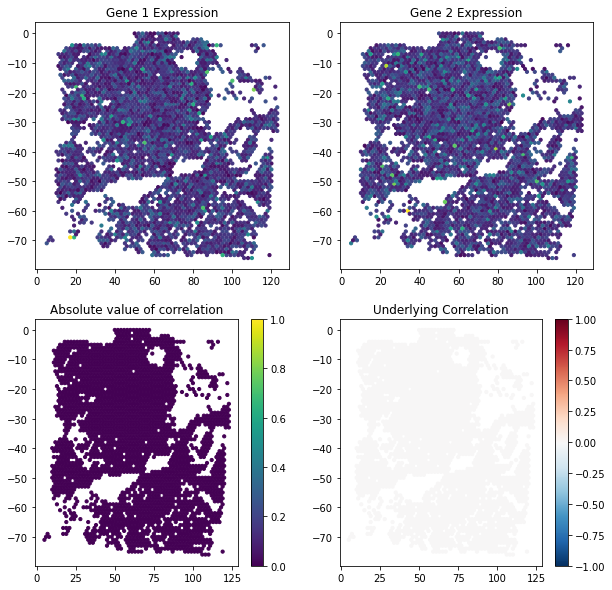

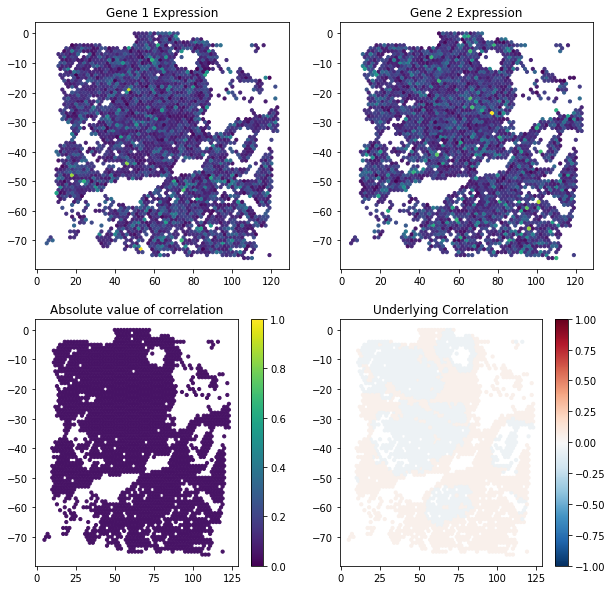

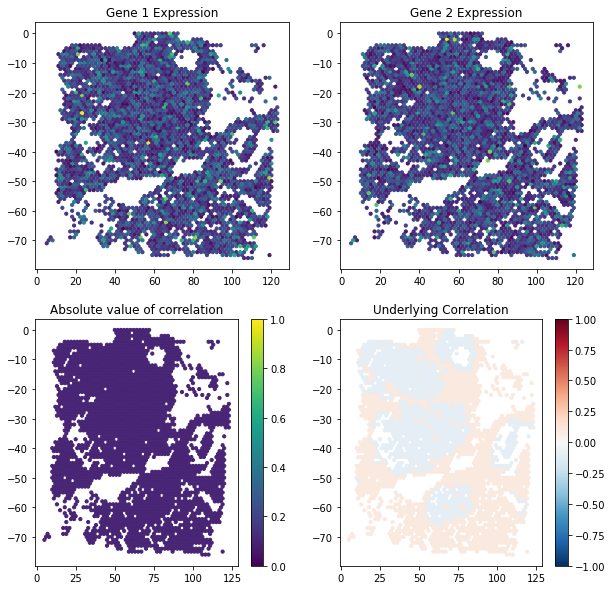

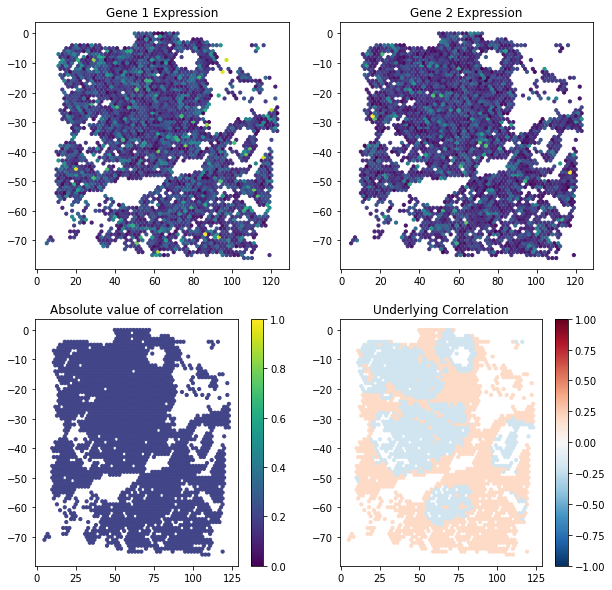

In [21]:
df_sim_data_means_static_corr_differ_0_0 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/config_differ.corr_between_0_0.static.means_CALML5.spotwise/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_means_static_corr_differ_0_1 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/config_differ.corr_between_0_1.static.means_CALML5/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_means_static_corr_differ_0_2 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/config_differ.corr_between_0_2.static.means_CALML5/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_means_static_corr_differ_0_4 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/config_differ.corr_between_0_4.static.means_CALML5/0.tsv'),
    sep='\t', index_col=0
)

simulate_data.plot_simulated_data(
    df_sim_data_means_static_corr_differ_0_0, 
    df_sim_data_means_static_corr_differ_0_0['dino_gene_1'], 
    df_sim_data_means_static_corr_differ_0_0['dino_gene_2'], 
    df_sim_data_means_static_corr_differ_0_0['correlation'], 
    df_sim_data_means_static_corr_differ_0_0['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_means_static_corr_differ_0_1, 
    df_sim_data_means_static_corr_differ_0_1['dino_gene_1'], 
    df_sim_data_means_static_corr_differ_0_1['dino_gene_2'], 
    df_sim_data_means_static_corr_differ_0_1['correlation'], 
    df_sim_data_means_static_corr_differ_0_1['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_means_static_corr_differ_0_2, 
    df_sim_data_means_static_corr_differ_0_2['dino_gene_1'], 
    df_sim_data_means_static_corr_differ_0_2['dino_gene_2'], 
    df_sim_data_means_static_corr_differ_0_2['correlation'], 
    df_sim_data_means_static_corr_differ_0_2['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_means_static_corr_differ_0_4, 
    df_sim_data_means_static_corr_differ_0_4['dino_gene_1'], 
    df_sim_data_means_static_corr_differ_0_4['dino_gene_2'], 
    df_sim_data_means_static_corr_differ_0_4['correlation'], 
    df_sim_data_means_static_corr_differ_0_4['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

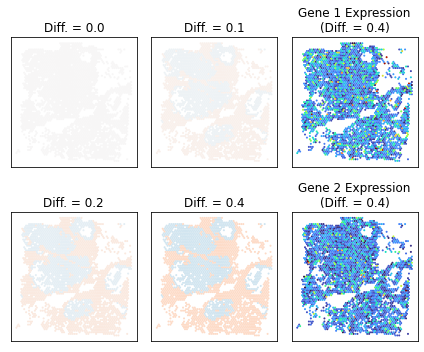

In [22]:
figure, axarr = plt.subplots(
    2,
    3,
    figsize = (6,5)
)

spatialcorr.plot_slide(
    df_sim_data_means_static_corr_differ_0_0,
    df_sim_data_means_static_corr_differ_0_0['correlation'],
    cmap='RdBu_r',
    colorbar=False,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.0',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[0][0],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_means_static_corr_differ_0_1,
    df_sim_data_means_static_corr_differ_0_1['correlation'],
    cmap='RdBu_r',
    colorbar=False,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.1',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[0][1],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_means_static_corr_differ_0_2, 
    df_sim_data_means_static_corr_differ_0_2['correlation'], 
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.2',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[1][0]
)


spatialcorr.plot_slide(
    df_sim_data_means_static_corr_differ_0_4, 
    df_sim_data_means_static_corr_differ_0_4['correlation'], 
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.4',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[1][1]
)

spatialcorr.plot_slide(
    df_sim_data_means_static_corr_differ_0_4,
    df_sim_data_means_static_corr_differ_0_4['dino_gene_1'],
    cmap='turbo',
    #colorbar=True,
    #vmin=-1,
    #vmax=1,
    title='Gene 1 Expression\n(Diff. = 0.4)',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[0][2],
)

spatialcorr.plot_slide(
    df_sim_data_means_static_corr_differ_0_4,
    df_sim_data_means_static_corr_differ_0_4['dino_gene_2'],
    cmap='turbo',
    title='Gene 2 Expression\n(Diff. = 0.4)',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[1][2],
)


plt.tight_layout()
figure.savefig(join(DATA_ROOT, 'figures/BHR_example_data_static_means.pdf'), format='pdf')

plt.show()

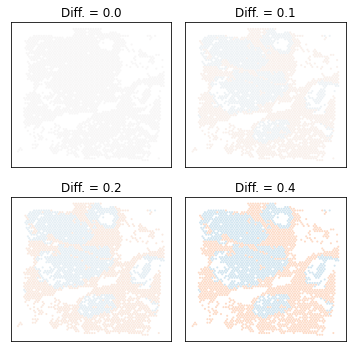

In [23]:
figure, axarr = plt.subplots(
    2,
    2,
    figsize = (5,5)
)

spatialcorr.plot_slide(
    df_sim_data_means_static_corr_differ_0_0,
    df_sim_data_means_static_corr_differ_0_0['correlation'],
    cmap='RdBu_r',
    colorbar=False,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.0',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[0][0],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_means_static_corr_differ_0_1,
    df_sim_data_means_static_corr_differ_0_1['correlation'],
    cmap='RdBu_r',
    colorbar=False,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.1',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[0][1],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_means_static_corr_differ_0_2, 
    df_sim_data_means_static_corr_differ_0_2['correlation'], 
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.2',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[1][0]
)


spatialcorr.plot_slide(
    df_sim_data_means_static_corr_differ_0_4, 
    df_sim_data_means_static_corr_differ_0_4['correlation'], 
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.4',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[1][1]
)

plt.tight_layout()
figure.savefig(join(DATA_ROOT, 'figures/BHR_example_data_static_means_V2.pdf'), format='pdf')

plt.show()

## Examine the results on some null datasets in which there is no difference in correlation between groups. However, there IS a difference in means.

In [33]:
df_sim_diff_means_cs_0_0_spotwise_test_between = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_between_dino-config_static.corr.differ.means.tsv'),
    sep='\t', index_col=0
)

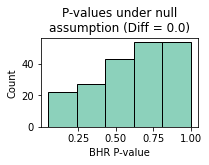

In [34]:
fig, ax = plt.subplots(
    1,
    1,
    figsize = (3,2.4)
)
sns.histplot(df_sim_diff_means_cs_0_0_spotwise_test_between['p_value'], bins=5, ax=ax)
ax.set_xlabel('BHR P-value')
plt.title('P-values under null\nassumption (Diff = 0.0)')

plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/distr_p_vals_null_BHR_diff_means.pdf'), format='pdf')

#### Increase difference in correlation between groups

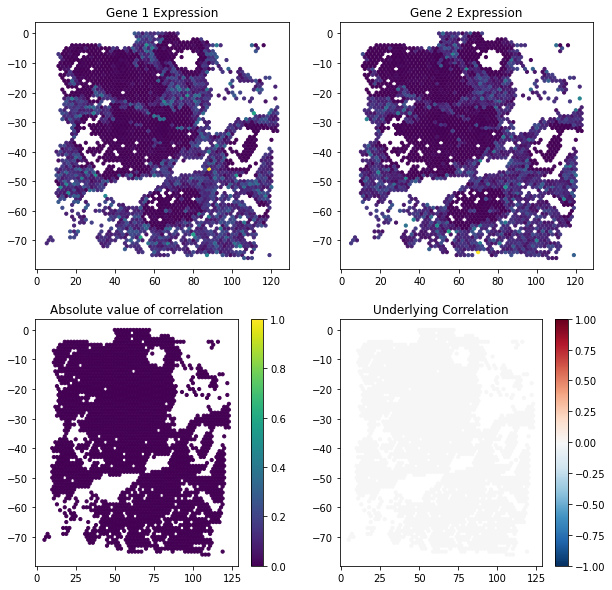

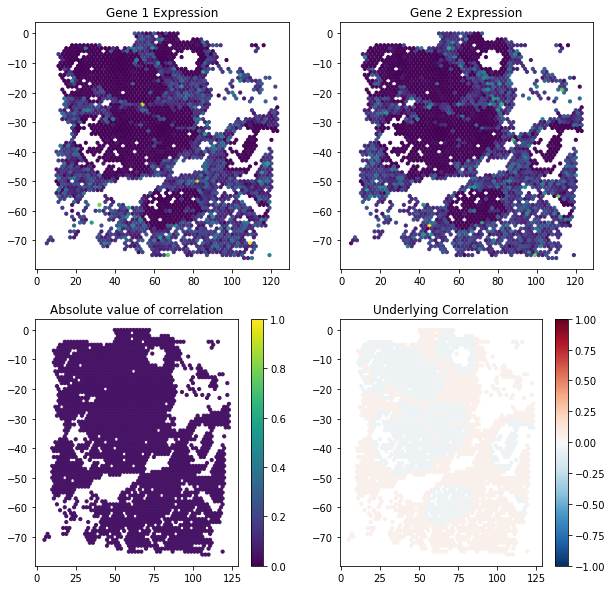

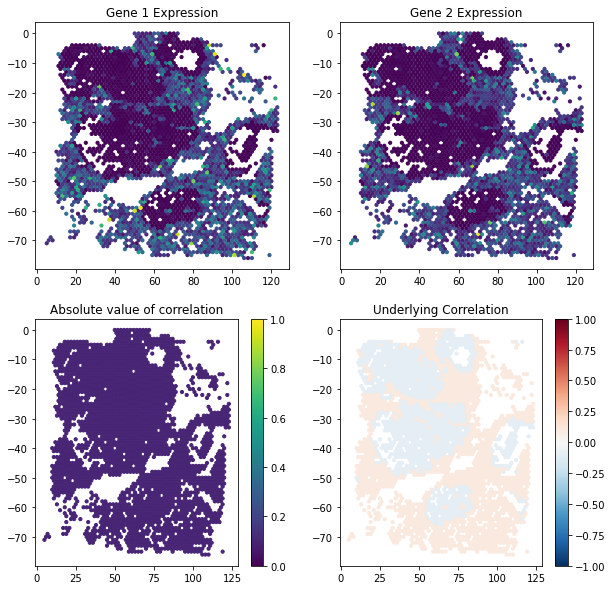

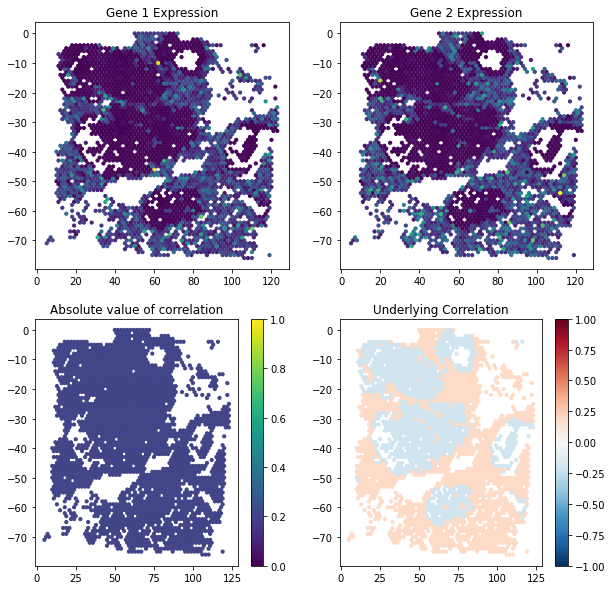

In [25]:
df_sim_data_means_differ_corr_differ_0_0 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/config_static.corr.differ.means/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_means_differ_corr_differ_0_1 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/config_differ.corr_between_0_1.differ.means/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_means_differ_corr_differ_0_2 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/config_differ.corr_between_0_2.differ.means/0.tsv'),
    sep='\t', index_col=0
)
df_sim_data_means_differ_corr_differ_0_4 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/config_differ.corr_between_0_4.differ.means/0.tsv'),
    sep='\t', index_col=0
)

simulate_data.plot_simulated_data(
    df_sim_data_means_differ_corr_differ_0_0, 
    df_sim_data_means_differ_corr_differ_0_0['dino_gene_1'], 
    df_sim_data_means_differ_corr_differ_0_0['dino_gene_2'], 
    df_sim_data_means_differ_corr_differ_0_0['correlation'], 
    df_sim_data_means_differ_corr_differ_0_0['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_means_differ_corr_differ_0_1, 
    df_sim_data_means_differ_corr_differ_0_1['dino_gene_1'], 
    df_sim_data_means_differ_corr_differ_0_1['dino_gene_2'], 
    df_sim_data_means_differ_corr_differ_0_1['correlation'], 
    df_sim_data_means_differ_corr_differ_0_1['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_means_differ_corr_differ_0_2, 
    df_sim_data_means_differ_corr_differ_0_2['dino_gene_1'], 
    df_sim_data_means_differ_corr_differ_0_2['dino_gene_2'], 
    df_sim_data_means_differ_corr_differ_0_2['correlation'], 
    df_sim_data_means_differ_corr_differ_0_2['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_means_differ_corr_differ_0_4, 
    df_sim_data_means_differ_corr_differ_0_4['dino_gene_1'], 
    df_sim_data_means_differ_corr_differ_0_4['dino_gene_2'], 
    df_sim_data_means_differ_corr_differ_0_4['correlation'], 
    df_sim_data_means_differ_corr_differ_0_4['covariance'], 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

Create publication-ready figure

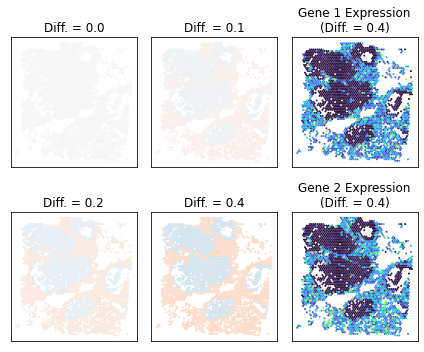

In [26]:
figure, axarr = plt.subplots(
    2,
    3,
    figsize = (6,5)
)

spatialcorr.plot_slide(
    df_sim_data_means_differ_corr_differ_0_0,
    df_sim_data_means_differ_corr_differ_0_0['correlation'],
    cmap='RdBu_r',
    colorbar=False,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.0',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[0][0],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_means_differ_corr_differ_0_1,
    df_sim_data_means_differ_corr_differ_0_1['correlation'],
    cmap='RdBu_r',
    colorbar=False,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.1',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[0][1],
    figure=figure
)

spatialcorr.plot_slide(
    df_sim_data_means_differ_corr_differ_0_2, 
    df_sim_data_means_differ_corr_differ_0_2['correlation'], 
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.2',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[1][0]
)


spatialcorr.plot_slide(
    df_sim_data_means_differ_corr_differ_0_4, 
    df_sim_data_means_differ_corr_differ_0_4['correlation'], 
    cmap='RdBu_r',
    #colorbar=True,
    vmin=-1,
    vmax=1,
    title='Diff. = 0.4',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[1][1]
)

spatialcorr.plot_slide(
    df_sim_data_means_differ_corr_differ_0_4,
    df_sim_data_means_differ_corr_differ_0_4['dino_gene_1'],
    cmap='turbo',
    title='Gene 1 Expression\n(Diff. = 0.4)',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[0][2],
)

spatialcorr.plot_slide(
    df_sim_data_means_differ_corr_differ_0_4,
    df_sim_data_means_differ_corr_differ_0_4['dino_gene_2'],
    cmap='turbo',
    title='Gene 2 Expression\n(Diff. = 0.4)',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=axarr[1][2],
)


plt.tight_layout()
figure.savefig(join(DATA_ROOT, 'figures/BHR_example_data_diff_means.pdf'), format='pdf')

plt.show()

Create figure for supplement illustration cl

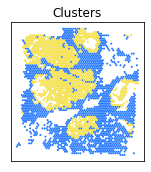

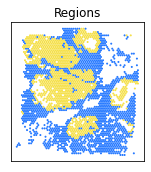

In [29]:
fig, ax = plt.subplots(
    1,
    1,
    figsize = (2.2,2.5)
)
spatialcorr.plot_slide(
    df_sim_data_means_differ_corr_differ_0_4, 
    [
        x in set([0, 1])
        for x in df_sim_data_means_differ_corr_differ_0_4['cluster']
    ],  
    cmap='categorical',
    #colorbar=True,
    #vmin=-1,
    #vmax=1,
    title='Clusters',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=ax,
    cat_palette = ['#f5e049', '#297bff']
)
ax.set_title('Clusters')
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/BHR_example_data_clusters.pdf'), format='pdf')
plt.show()

fig, ax = plt.subplots(
    1,
    1,
    figsize = (2.2,2.5)
)
spatialcorr.plot_slide(
    df_sim_data_means_differ_corr_differ_0_4, 
    [
        x in set([0, 1])
        for x in df_sim_data_means_differ_corr_differ_0_4['cluster']
    ],  
    cmap='categorical',
    #colorbar=True,
    #vmin=-1,
    #vmax=1,
    title='Regions',
    row_key='row',
    col_key='col',
    dsize=1,
    ticks=False,
    ax=ax,
    cat_palette = ['#f5e049', '#297bff']
)
ax.set_title('Regions')
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/BHR_example_data_clusters_V2.pdf'), format='pdf')

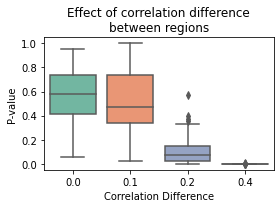

In [39]:
df_sim_diff_means_cs_0_0_spotwise_test_between_diff_corr_0_1 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_between_dino-config_differ.corr_between_0_1.differ.means.tsv'),
    sep='\t', index_col=0
)
df_sim_diff_means_cs_0_0_spotwise_test_between_diff_corr_0_2 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_between_dino-config_differ.corr_between_0_2.differ.means.tsv'),
    sep='\t', index_col=0
)
df_sim_diff_means_cs_0_0_spotwise_test_between_diff_corr_0_4 = pd.read_csv(
    join(DATA_ROOT, 'simulation_results/sigma_5_condition_custer_test_between_dino-config_differ.corr_between_0_4.differ.means.tsv'),
    sep='\t', index_col=0
)


da = [
    (p_val, '0.0')
    for p_val in df_sim_diff_means_cs_0_0_spotwise_test_between['p_value'][:30]
]
da += [
    (p_val, '0.1')
    for p_val in df_sim_diff_means_cs_0_0_spotwise_test_between_diff_corr_0_1['p_value']
]
da += [
    (p_val, '0.2')
    for p_val in df_sim_diff_means_cs_0_0_spotwise_test_between_diff_corr_0_2['p_value']
]
da += [
    (p_val, '0.4')
    for p_val in df_sim_diff_means_cs_0_0_spotwise_test_between_diff_corr_0_4['p_value']
]
plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', 'Correlation Difference']
)

fig, ax = plt.subplots(
    1,
    1,
    figsize=(4,3)
)
sns.boxplot(data=plot_df, x='Correlation Difference', y='P-value', ax=ax)
#sns.stripplot(data=plot_df, x='Correlation Difference', y='P-value', color='black', ax=ax)
ax.set_title("Effect of correlation difference\nbetween regions")
#plt.show()

plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/p_value_distr_BHR_increase_corr_diff.pdf'), format='pdf')

## Multiple genes

First let's just visualize one of the multi-gene datasets

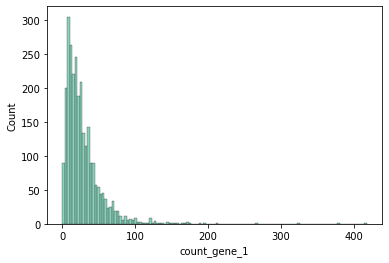

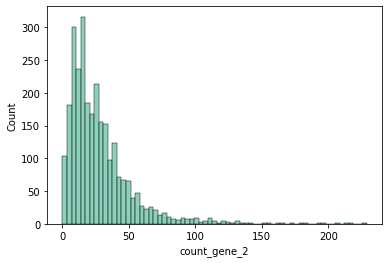

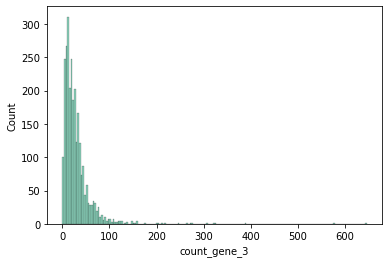

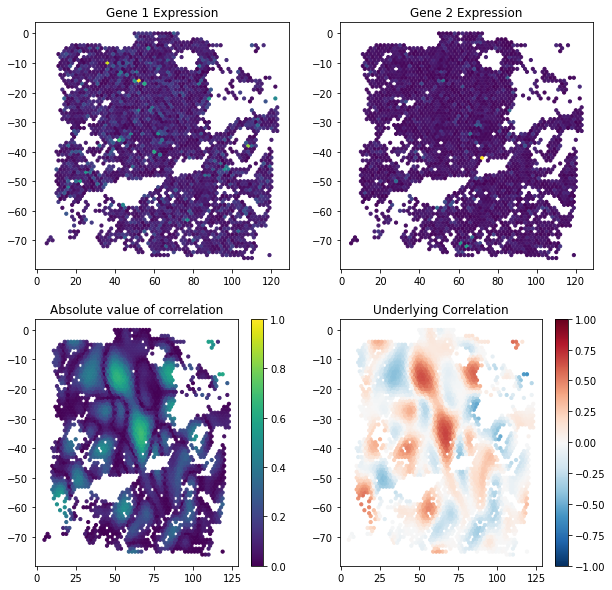

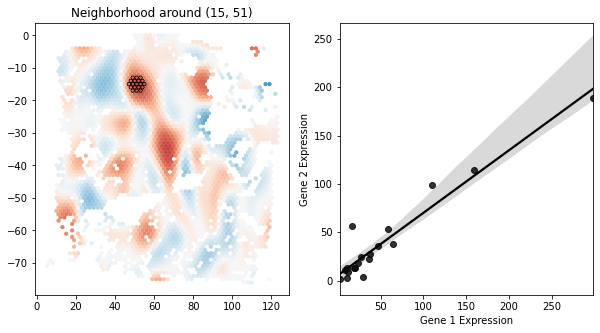

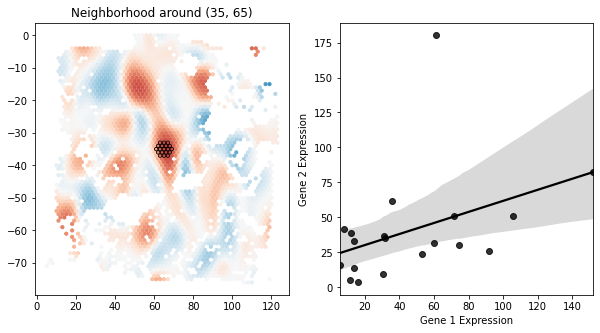

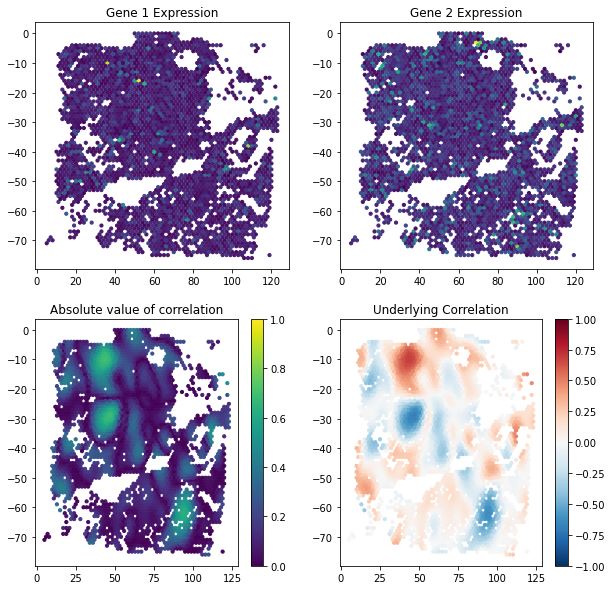

In [40]:
df_sim_data_mult_genes_cs_0_1_all_CALML5 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/mg_5.CALML5_sigma_10_cs_0.1/0.tsv'),
    sep='\t', index_col=0
)
corrs_0_1 = [eval(x)[0][1] for x in df_sim_data_mult_genes_cs_0_1_all_CALML5['correlation']]
covs_0_1 = [eval(x)[0][1] for x in df_sim_data_mult_genes_cs_0_1_all_CALML5['covariance']]

corrs_0_2 = [eval(x)[0][2] for x in df_sim_data_mult_genes_cs_0_1_all_CALML5['correlation']]
covs_0_2 = [eval(x)[0][2] for x in df_sim_data_mult_genes_cs_0_1_all_CALML5['covariance']]

sns.histplot(df_sim_data_mult_genes_cs_0_1_all_CALML5['count_gene_1'])
plt.show()

sns.histplot(df_sim_data_mult_genes_cs_0_1_all_CALML5['count_gene_2'])
plt.show()

sns.histplot(df_sim_data_mult_genes_cs_0_1_all_CALML5['count_gene_3'])
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_mult_genes_cs_0_1_all_CALML5, 
    df_sim_data_mult_genes_cs_0_1_all_CALML5['dino_gene_0'], 
    df_sim_data_mult_genes_cs_0_1_all_CALML5['dino_gene_1'], 
    corrs_0_1, 
    covs_0_1, 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()


spatialcorr.plot.plot_local_scatter(
    build_adata_from_sim_dataframe(
        df_sim_data_mult_genes_cs_0_1_all_CALML5,
        g1='dino_gene_0',
        g2='dino_gene_1'
    ),
    'Gene 1',
    'Gene 2',
    15, 51,
    corrs_0_1,
    color_spots=None,
    condition=None,
    vmin=-1,
    vmax=1,
    row_key='row',
    col_key='col',
    cmap='RdBu_r',
    neighb_color='black',
    plot_neigh=True,
    width=10,
    height=5,
    line_color='black',
    scatter_xlim=None,
    scatter_ylim=None,
    scatter_xlabel=None,
    scatter_ylabel=None,
    scatter_title=None,
    fig_path=None,
    fig_format='pdf',
    fig_dpi=150,
)

spatialcorr.plot.plot_local_scatter(
    build_adata_from_sim_dataframe(
        df_sim_data_mult_genes_cs_0_1_all_CALML5,
        g1='dino_gene_0',
        g2='dino_gene_1'
    ),
    'Gene 1',
    'Gene 2',
    35, 65,
    corrs_0_1,
    color_spots=None,
    condition=None,
    vmin=-1,
    vmax=1,
    row_key='row',
    col_key='col',
    cmap='RdBu_r',
    neighb_color='black',
    plot_neigh=True,
    width=10,
    height=5,
    line_color='black',
    scatter_xlim=None,
    scatter_ylim=None,
    scatter_xlabel=None,
    scatter_ylabel=None,
    scatter_title=None,
    fig_path=None,
    fig_format='pdf',
    fig_dpi=150,
)

simulate_data.plot_simulated_data(
    df_sim_data_mult_genes_cs_0_1_all_CALML5, 
    df_sim_data_mult_genes_cs_0_1_all_CALML5['dino_gene_0'], 
    df_sim_data_mult_genes_cs_0_1_all_CALML5['dino_gene_2'], 
    corrs_0_2, 
    covs_0_2, 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

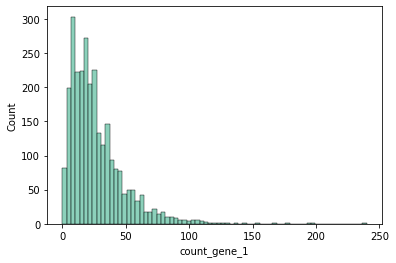

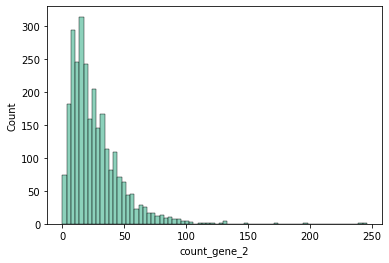

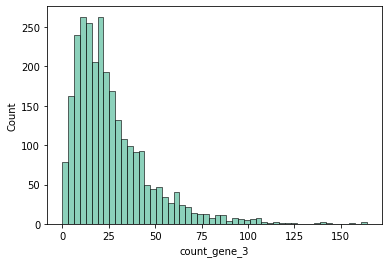

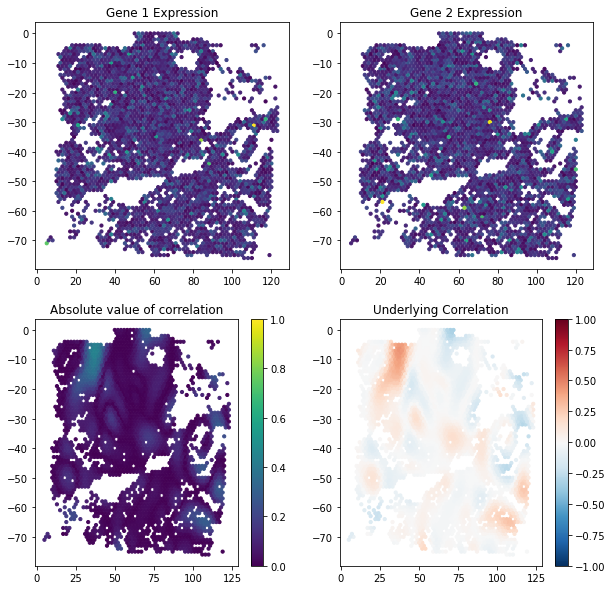

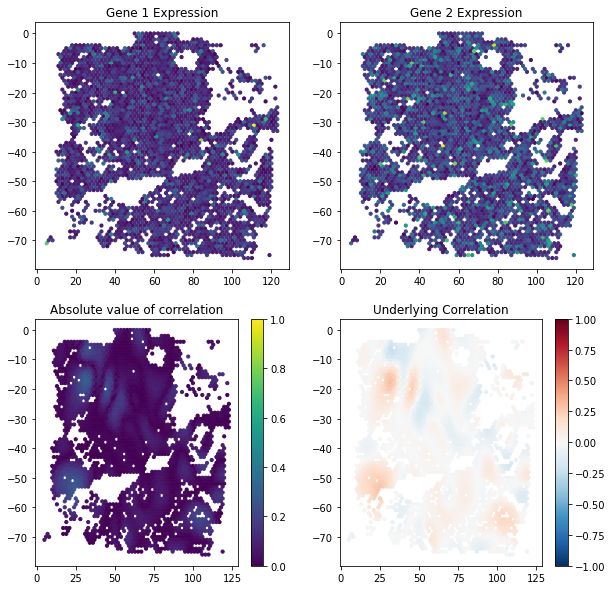

In [41]:
df_sim_data_mult_genes_cs_0_025_all_CALML5 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/mg_5.CALML5_sigma_10_cs_0.025/0.tsv'),
    sep='\t', index_col=0
)
corrs_0_1 = [eval(x)[0][1] for x in df_sim_data_mult_genes_cs_0_025_all_CALML5['correlation']]
covs_0_1 = [eval(x)[0][1] for x in df_sim_data_mult_genes_cs_0_025_all_CALML5['covariance']]

corrs_0_2 = [eval(x)[0][2] for x in df_sim_data_mult_genes_cs_0_025_all_CALML5['correlation']]
covs_0_2 = [eval(x)[0][2] for x in df_sim_data_mult_genes_cs_0_025_all_CALML5['covariance']]

sns.histplot(df_sim_data_mult_genes_cs_0_025_all_CALML5['count_gene_1'])
plt.show()

sns.histplot(df_sim_data_mult_genes_cs_0_025_all_CALML5['count_gene_2'])
plt.show()

sns.histplot(df_sim_data_mult_genes_cs_0_025_all_CALML5['count_gene_3'])
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_mult_genes_cs_0_025_all_CALML5, 
    df_sim_data_mult_genes_cs_0_025_all_CALML5['dino_gene_1'], 
    df_sim_data_mult_genes_cs_0_025_all_CALML5['dino_gene_2'], 
    corrs_0_1, 
    covs_0_1, 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_mult_genes_cs_0_025_all_CALML5, 
    df_sim_data_mult_genes_cs_0_025_all_CALML5['dino_gene_1'], 
    df_sim_data_mult_genes_cs_0_025_all_CALML5['dino_gene_3'], 
    corrs_0_2, 
    covs_0_2, 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

### Compare joint vs. multiple pairwise tests

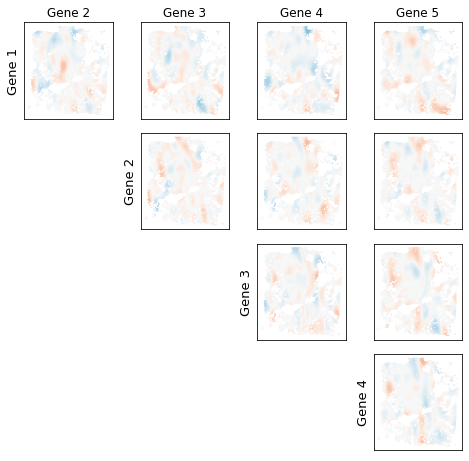

In [44]:
df_sim_data_mult_genes_cs_0_035_all_CALML5 = pd.read_csv(
    join(DATA_ROOT, 'simulated_datasets_dino/mg_5.CALML5_sigma_10_cs_0.035/0.tsv'),
    sep='\t', index_col=0
)

all_sim_corrs = [
    eval(row['correlation'])
    for r_i, row in df_sim_data_mult_genes_cs_0_035_all_CALML5.iterrows()
]

sim_index = 0

fig, axarr = plt.subplots(
    5,
    5,
    figsize=(8,8)
)
for row, ax_row in enumerate(axarr):
    for col, ax in enumerate(ax_row):
        corrs = [
            x[row][col]
            for x in all_sim_corrs
        ]
        if col > row:
            if row == 0:
                title = f'Gene {col+1}'
            else: 
                title = None
                
            if col == row+1:
                ax.set_ylabel(f'Gene {row+1}', fontsize=13)
            spatialcorr.plot_slide(
                df_sim_data_mult_genes_cs_0_035_all_CALML5, 
                corrs, 
                cmap='RdBu_r', 
                colorbar=False, 
                vmin=-1, 
                vmax=1, 
                title=title, 
                ax=ax, 
                figure=fig,
                ticks=False, 
                dsize=0.2,
                row_key='row',
                col_key='col'
            )
        else:
            ax.set_visible(False)
        
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/compare_joint_vs_pairwise_example_data.pdf'), format='pdf')
plt.show()

In [13]:
with open(join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-mg_5.CALML5_sigma_10_cs_0.035.json'), 'r') as f:
    j_sim_mg_5_CALML5_cs_0_035_spotwise = json.load(f)
with open(join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-mg_5.CALML5_sigma_10_cs_0.035_v2.json'), 'r') as f:
    j_sim_mg_5_CALML5_cs_0_035_spotwise_v2 = json.load(f)
with open(join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-mg_5.CALML5_sigma_10_cs_0.035_v3.json'), 'r') as f:
    j_sim_mg_5_CALML5_cs_0_035_spotwise_v3 = json.load(f)

In [19]:
sims_joint_sig = set()
sims_one_pair_sig = set()
all_res = list(j_sim_mg_5_CALML5_cs_0_035_spotwise.values()) \
    + list(j_sim_mg_5_CALML5_cs_0_035_spotwise_v2.values()) \
    + list(j_sim_mg_5_CALML5_cs_0_035_spotwise_v3.values())
for sim_i, sim_res in enumerate(all_res):
    if sim_res['joint_p_value'] < 0.05:
        sims_joint_sig.add(sim_i)
    pvals = list(sim_res['pairwise_p_values'].values())
    r = multipletests(pvals, alpha=0.05, method='fdr_bh')
    if True in set(r[0]):
        sims_one_pair_sig.add(sim_i)

print("Total simulations: ", len(j_sim_mg_5_CALML5_cs_0_035_spotwise) + len(j_sim_mg_5_CALML5_cs_0_035_spotwise_v2))
print("Number w/ joint sig: ", len(sims_joint_sig ))
print("Number w/ joint sig, not pairwise sig: ", len(sims_joint_sig - sims_one_pair_sig))
print("Number w/ pairwise sig, not joint sig: ", len(sims_one_pair_sig - sims_joint_sig))
print("Number w/ pairwise sig, joint sig: ", len(sims_one_pair_sig & sims_joint_sig))

Total simulations:  60
Number w/ joint sig:  75
Number w/ joint sig, not pairwise sig:  31
Number w/ pairwise sig, not joint sig:  5
Number w/ pairwise sig, joint sig:  44


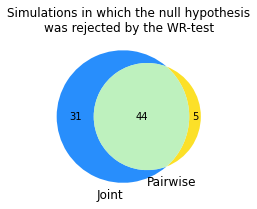

In [20]:
from matplotlib_venn import venn2

fig, ax = plt.subplots(1,1,figsize=(4.2,3))
venn2(
    subsets=(
        len(sims_joint_sig - sims_one_pair_sig), # Left
        len(sims_one_pair_sig - sims_joint_sig), # Right
        len(sims_one_pair_sig & sims_joint_sig) # Center
    ),
    set_labels = (
        'Joint',
        'Pairwise'
    ),
    set_colors=('#037bfc', '#fcdb03'),
    alpha = 0.85,
    ax=ax
)
ax.set_title('Simulations in which the null hypothesis\nwas rejected by the WR-test')
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/compare_joint_vs_pairwise_venn.pdf'), format='pdf')
plt.show()

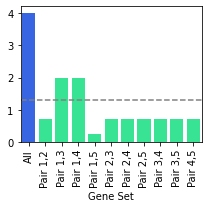

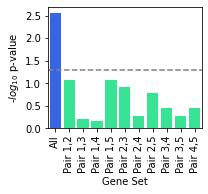

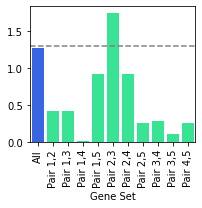

In [48]:


def _create_barplot_joint_vs_pairwise(sim_index, fname, ylabel=True):
    if ylabel:
        dim = (3,2.8)
    else:
        dim = (3, 3)
    fig, ax = plt.subplots(
        1,
        1,
        figsize=dim
    )
    res = j_sim_mg_5_CALML5_cs_0_035_spotwise[sim_index]
    pvals_w_pairs = [
        (pair, pval)
        for pair, pval in res['pairwise_p_values'].items()
    ]
    joint_pval = res['joint_p_value']
    pairs = [x[0] for x in pvals_w_pairs]
    pvals = [x[1] for x in pvals_w_pairs]
    r = multipletests(pvals, alpha=0.05, method='fdr_bh')
    pvals_adj = list(-1 * np.log10(r[1]))
    sns.barplot(
        x=['All'] + [f"Pair {int(x.split(',')[0])+1},{int(x.split(',')[1])+1}" for x in pairs], 
        y=[-1 * np.log10(joint_pval)] + list(pvals_adj), 
        ax=ax, 
        palette=['#1c59ff'] +  ['#1cff95' for x in pairs]
        #palette=['#1c59ff'] +  ['#FFFF00' for x in pairs]
    )
    ax.set_xticklabels(['All'] + [f"Pair {int(x.split(',')[0])+1},{int(x.split(',')[1])+1}" for x in pairs], rotation = 90)
    ax.axhline(-1 * np.log10(0.05), color='grey', ls='--')
    ax.set_xlabel('Gene Set')
    if ylabel:
        ax.set_ylabel(r'-$log_{10}$ p-value')
    #ax.set_title('Compare joint p-value to\npairwise adjusted p-values')
    plt.tight_layout()
    fig.savefig(
        fname, 
        format='pdf'
    )
    plt.show()
    

_create_barplot_joint_vs_pairwise('0', join(DATA_ROOT, 'figures/compare_joint_vs_pairwise_barplot_yes_joint_yes_pairwise.pdf'), ylabel=False);
_create_barplot_joint_vs_pairwise('2', join(DATA_ROOT, 'figures/compare_joint_vs_pairwise_barplot_yes_joint_no_pairwise.pdf'), ylabel=True);
_create_barplot_joint_vs_pairwise('4', join(DATA_ROOT, 'figures/compare_joint_vs_pairwise_barplot_no_joint_yes_pairwise.pdf'), ylabel=False);

### Compare joint test run on differing number of genes

In [68]:
with open(join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-mg_8.CALML5_sigma_10_cs_0.035.json'), 'r') as f:
    j_sim_mg_8_CALML5_cs_0_035_spotwise = json.load(f)
with open(join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-mg_4.CALML5_sigma_10_cs_0.035.json'), 'r') as f:
    j_sim_mg_4_CALML5_cs_0_035_spotwise = json.load(f)
with open(join(DATA_ROOT, 'simulation_results/sigma_5_condition_none_test_within_dino-mg_2.CALML5_sigma_10_cs_0.035.json'), 'r') as f:
    j_sim_mg_2_CALML5_cs_0_035_spotwise = json.load(f)

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/ipykernel_launcher.py:40: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_layout" which is no longer supported as of 3.3 and will become an error two minor releases later


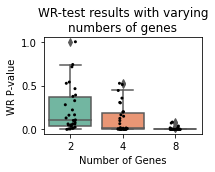

In [69]:
mg_2_pvals = [
    x['joint_p_value'] 
    for x in j_sim_mg_2_CALML5_cs_0_035_spotwise.values()
]
mg_4_pvals = [
    x['joint_p_value'] 
    for x in j_sim_mg_4_CALML5_cs_0_035_spotwise.values()
]
mg_8_pvals = [
    x['joint_p_value'] 
    for x in j_sim_mg_8_CALML5_cs_0_035_spotwise.values()
]

da = [
    (p_val, '2')
    for p_val in mg_2_pvals
]
da += [
    (p_val, '4')
    for p_val in mg_4_pvals
]
da += [
    (p_val, '8')
    for p_val in mg_8_pvals
]
plot_df = pd.DataFrame(
    data=da,
    columns=['WR P-value', 'Number of Genes']
)

figure, ax = plt.subplots(
    1, 
    1,
    figsize=(3,2.5)
)
sns.boxplot(data=plot_df, x='Number of Genes', y='WR P-value', ax=ax)
sns.stripplot(data=plot_df, x='Number of Genes', y='WR P-value', color='black', s=3, ax=ax)
ax.set_title('WR-test results with varying\nnumbers of genes')
plt.tight_layout()
figure.savefig(join(DATA_ROOT, 'figures/mult_genes_change_num_genes.pdf'), format='pdf', bbox_layout='tight')
plt.show()

### Multiple genes between test

In [9]:
with open('/Users/matthewbernstein/Development/spatialcorr_dev/simulation_study/spatialcorr_results/sigma_5_condition_none_test_between_dino-mg_5.corr_between_0_1.static_means_CALML5.json', 'r') as f:
    j_sim_mg_5_CALML5_diff_0_1_between = json.load(f)

In [17]:
sims_joint_sig = set()
sims_one_pair_sig = set()
all_res = list(j_sim_mg_5_CALML5_diff_0_1_between.values()) 
for sim_i, sim_res in enumerate(all_res):
    if sim_res['joint_p_value'] < 0.05:
        sims_joint_sig.add(sim_i)
    pvals = list(sim_res['pairwise_p_values'].values())
    r = multipletests(pvals, alpha=0.05, method='fdr_bh')
    if True in set(r[0]):
        sims_one_pair_sig.add(sim_i)

print("Total simulations: ", len(j_sim_mg_5_CALML5_diff_0_1_between))
print("Number w/ joint sig: ", len(sims_joint_sig ))
print("Number w/ joint sig, not pairwise sig: ", len(sims_joint_sig - sims_one_pair_sig))
print("Number w/ pairwise sig, not joint sig: ", len(sims_one_pair_sig - sims_joint_sig))
print("Number w/ pairwise sig, joint sig: ", len(sims_one_pair_sig & sims_joint_sig))

Total simulations:  100
Number w/ joint sig:  82
Number w/ joint sig, not pairwise sig:  18
Number w/ pairwise sig, not joint sig:  1
Number w/ pairwise sig, joint sig:  64


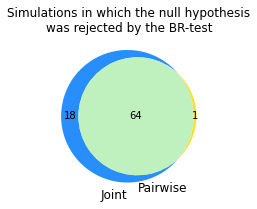

In [18]:
from matplotlib_venn import venn2

fig, ax = plt.subplots(1,1,figsize=(4.2,3))
venn2(
    subsets=(
        len(sims_joint_sig - sims_one_pair_sig), # Left
        len(sims_one_pair_sig - sims_joint_sig), # Right
        len(sims_one_pair_sig & sims_joint_sig) # Center
    ),
    set_labels = (
        'Joint',
        'Pairwise'
    ),
    set_colors=('#037bfc', '#fcdb03'),
    alpha = 0.85,
    ax=ax
)
ax.set_title('Simulations in which the null hypothesis\nwas rejected by the BR-test')
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/compare_joint_vs_pairwise_BR_venn.pdf'), format='pdf')
plt.show()

### Test BR-test with increasing number of genes

In [40]:
with open('/Users/matthewbernstein/Development/spatialcorr_dev/simulation_study/spatialcorr_results/sigma_5_condition_none_test_between_dino-mg_2.corr_between_0_1.static_means_CALML5.json', 'r') as f:
    j_sim_mg_2_CALML5_diff_0_1 = json.load(f)
with open('/Users/matthewbernstein/Development/spatialcorr_dev/simulation_study/spatialcorr_results/sigma_5_condition_none_test_between_dino-mg_4.corr_between_0_1.static_means_CALML5.json', 'r') as f:
    j_sim_mg_4_CALML5_diff_0_1 = json.load(f)
with open('/Users/matthewbernstein/Development/spatialcorr_dev/simulation_study/spatialcorr_results/sigma_5_condition_none_test_between_dino-mg_8.corr_between_0_1.static_means_CALML5.json', 'r') as f:
    j_sim_mg_8_CALML5_diff_0_1 = json.load(f)

/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/ipykernel_launcher.py:40: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_layout" which is no longer supported as of 3.3 and will become an error two minor releases later


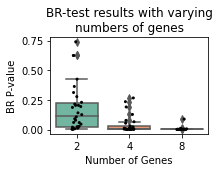

In [71]:
mg_2_pvals = [
    x['joint_p_value'] 
    for x in j_sim_mg_2_CALML5_diff_0_1.values()
]
mg_4_pvals = [
    x['joint_p_value'] 
    for x in j_sim_mg_4_CALML5_diff_0_1.values()
]
mg_8_pvals = [
    x['joint_p_value'] 
    for x in j_sim_mg_8_CALML5_diff_0_1.values()
]

da = [
    (p_val, '2')
    for p_val in mg_2_pvals
]
da += [
    (p_val, '4')
    for p_val in mg_4_pvals
]
da += [
    (p_val, '8')
    for p_val in mg_8_pvals
]
plot_df = pd.DataFrame(
    data=da,
    columns=['BR P-value', 'Number of Genes']
)

figure, ax = plt.subplots(
    1, 
    1,
    figsize=(3,2.5)
)
sns.boxplot(data=plot_df, x='Number of Genes', y='BR P-value', ax=ax)
sns.stripplot(data=plot_df, x='Number of Genes', y='BR P-value', color='black', s=3, ax=ax)
ax.set_title('BR-test results with varying\nnumbers of genes')
plt.tight_layout()
figure.savefig(join(DATA_ROOT, 'figures/mult_genes_change_num_genes_BR_test.pdf'), format='pdf', bbox_layout='tight')
plt.show()

### Examine of the simulated datasets more closely

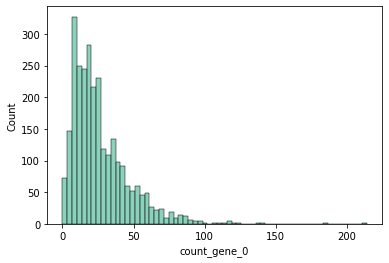

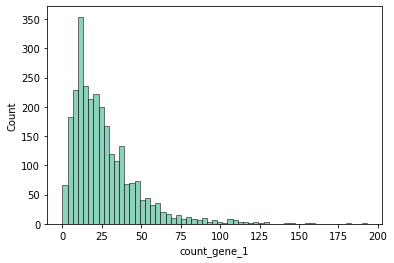

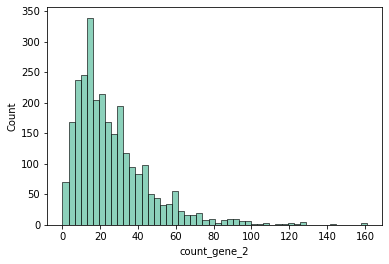

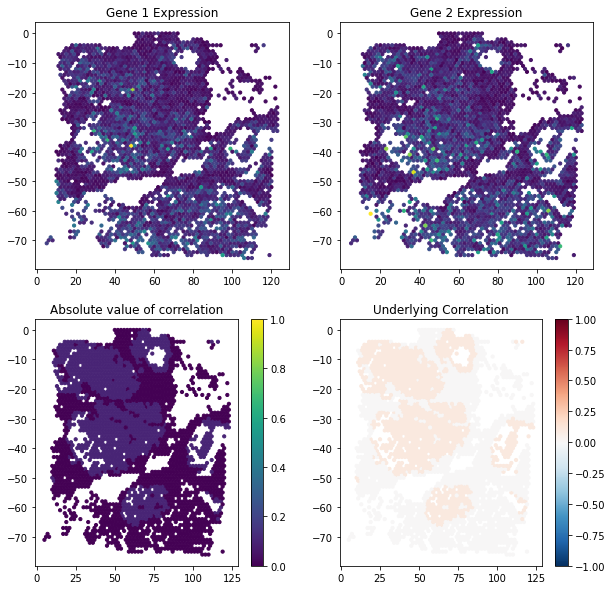

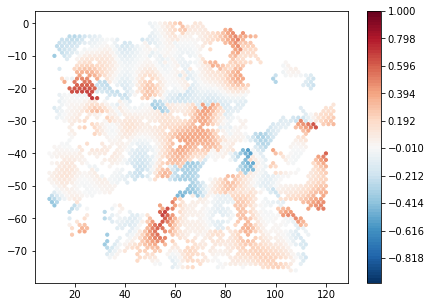

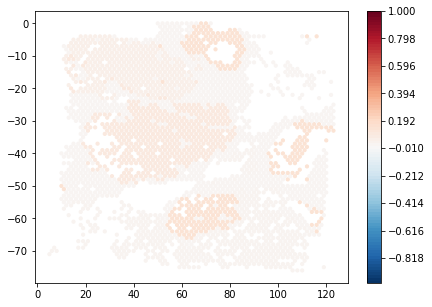

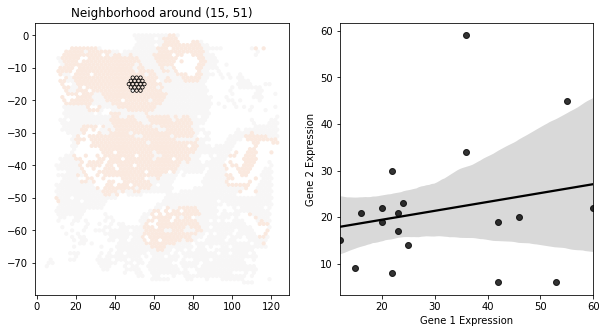

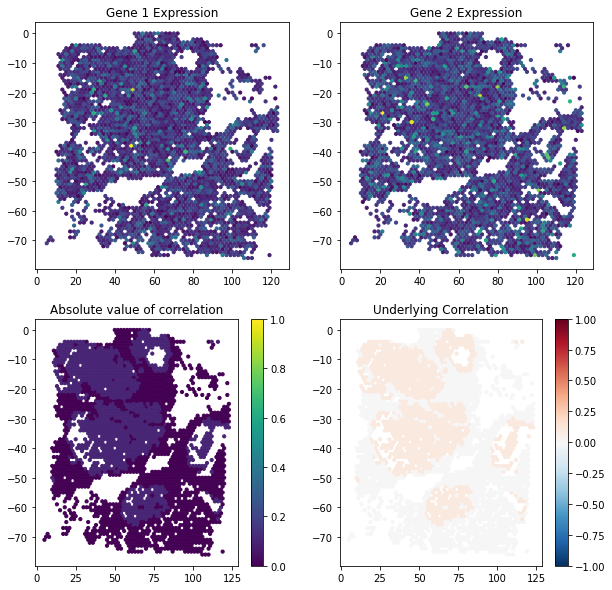

In [8]:
df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1 = pd.read_csv(
    './dino_normalized_simulated_datasets/mg_5.corr_between_0_1.static.means_CALML5.spotwise/0.tsv',
    sep='\t', index_col=0
)

corrs_0_1 = [eval(x)[0][1] for x in df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1['correlation']]
covs_0_1 = [eval(x)[0][1] for x in df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1['covariance']]

corrs_0_2 = [eval(x)[0][2] for x in df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1['correlation']]
covs_0_2 = [eval(x)[0][2] for x in df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1['covariance']]

sns.histplot(df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1['count_gene_0'])
plt.show()

sns.histplot(df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1['count_gene_1'])
plt.show()

sns.histplot(df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1['count_gene_2'])
plt.show()

simulate_data.plot_simulated_data(
    df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1, 
    df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1['count_gene_0'], 
    df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1['count_gene_1'], 
    corrs_0_1, 
    covs_0_1, 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

ad = build_adata_from_sim_dataframe(
    df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1,
    g1='dino_gene_0',
    g2='dino_gene_1'
)
ad.obs['cluster'] = df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1['cluster']

spatialcorr.plot.plot_correlation(
    ad,
    'Gene 1',
    'Gene 2',
    sigma=5,
    contrib_thresh=10,
    kernel_matrix=None,
    row_key='row',
    col_key='col',
    condition='cluster',
    cmap='RdBu_r',
    colorbar=True,
    ticks=True,
    ax=None,
    figure=None,
    dsize=10,
    estimate='local',
    title=None
)
spatialcorr.plot.plot_correlation(
    ad,
    'Gene 1',
    'Gene 2',
    sigma=5,
    contrib_thresh=10,
    kernel_matrix=None,
    row_key='row',
    col_key='col',
    condition='cluster',
    cmap='RdBu_r',
    colorbar=True,
    ticks=True,
    ax=None,
    figure=None,
    dsize=10,
    estimate='regional',
    title=None
)


spatialcorr.plot.plot_local_scatter(
    build_adata_from_sim_dataframe(
        df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1,
        g1='count_gene_0',
        g2='count_gene_1'
    ),
    'Gene 1',
    'Gene 2',
    15, 51,
    corrs_0_1,
    color_spots=None,
    condition=None,
    vmin=-1,
    vmax=1,
    row_key='row',
    col_key='col',
    cmap='RdBu_r',
    neighb_color='black',
    plot_neigh=True,
    width=10,
    height=5,
    line_color='black',
    scatter_xlim=None,
    scatter_ylim=None,
    scatter_xlabel=None,
    scatter_ylabel=None,
    scatter_title=None,
    fig_path=None,
    fig_format='pdf',
    fig_dpi=150,
)


simulate_data.plot_simulated_data(
    df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1, 
    df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1['dino_gene_0'], 
    df_sim_data_mult_genes_5_all_CALML5_diff_corr_0_1['dino_gene_2'], 
    corrs_0_2, 
    covs_0_2, 
    row_key='row',
    col_key='col',
    dot_size=10
)
plt.show()

## Comparison to sHOT

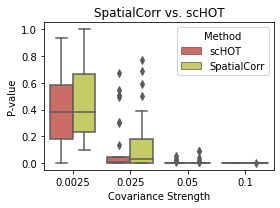

In [53]:
da = []
for elem in os.listdir(join(DATA_ROOT, 'scHOT/outs/g_CALML5.CALML5_sigma_10_cs_0.0025')):
    fname = join(DATA_ROOT, f'scHOT/outs/g_CALML5.CALML5_sigma_10_cs_0.0025/{elem}')
    df_schot = pd.read_csv(fname, sep='\t')
    p_val = df_schot.iloc[0]['pvalEstimated']
    da.append((p_val, 'scHOT', '0.0025'))
for elem in os.listdir(join(DATA_ROOT, 'scHOT/outs/g_CALML5.CALML5_sigma_10_cs_0.025')):
    fname = join(DATA_ROOT, f'scHOT/outs/g_CALML5.CALML5_sigma_10_cs_0.025/{elem}')
    df_schot = pd.read_csv(fname, sep='\t')
    p_val = df_schot.iloc[0]['pvalEstimated']
    da.append((p_val, 'scHOT', '0.025'))
for elem in os.listdir(join(DATA_ROOT, 'scHOT/outs/g_CALML5.CALML5_sigma_10_cs_0.05')):
    fname = join(DATA_ROOT, f'scHOT/outs/g_CALML5.CALML5_sigma_10_cs_0.05/{elem}')
    df_schot = pd.read_csv(fname, sep='\t')
    p_val = df_schot.iloc[0]['pvalEstimated']
    da.append((p_val, 'scHOT', '0.05'))
for elem in os.listdir(join(DATA_ROOT, 'scHOT/outs/g_CALML5.CALML5_sigma_10_cs_0.1')):
    fname = join(DATA_ROOT, f'scHOT/outs/g_CALML5.CALML5_sigma_10_cs_0.1/{elem}')
    df_schot = pd.read_csv(fname, sep='\t')
    p_val = df_schot.iloc[0]['pvalEstimated']
    da.append((p_val, 'scHOT', '0.1'))

da += [
    (p_val, 'SpatialCorr', '0.0025')
    for p_val in df_sim_sig_5_cs_0_0025_spotwise['p_value']
]
da += [
    (p_val, 'SpatialCorr', '0.025')
    for p_val in df_sim_sig_5_cs_0_025_spotwise['p_value']
]
da += [
    (p_val, 'SpatialCorr', '0.05')
    for p_val in df_sim_sig_5_cs_0_05_spotwise['p_value']
]
da += [
    (p_val, 'SpatialCorr', '0.1')
    for p_val in df_sim_sig_5_cs_0_1_spotwise['p_value']
]

plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', 'Method', 'Covariance Strength']
)

sns.set_palette("hls")
fig, ax = plt.subplots(
    1,
    1,
    figsize=(4,3)
)
sns.boxplot(data=plot_df, x='Covariance Strength', y='P-value', hue='Method', ax=ax)
ax.set_title('SpatialCorr vs. scHOT')
plt.tight_layout()
fig.savefig(join(DATA_ROOT, 'figures/scHOT_vs_SpatialCorr_static_mean_change_cov_strength.pdf'), format='pdf')
plt.show()
sns.set_palette("Set2")

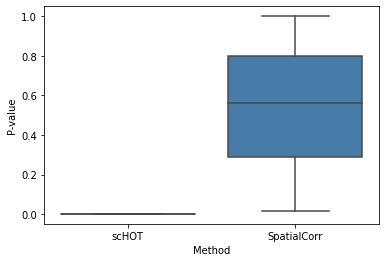

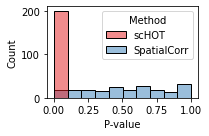

In [55]:
sns.set_palette("Set1")
schot_pvals = []
spacor_pvals = []
da = []
for elem in os.listdir(join(DATA_ROOT, 'scHOT/outs/config_static.corr.differ.means.2')):
    fname = join(DATA_ROOT, f'scHOT/outs/config_static.corr.differ.means.2/{elem}')
    df_schot = pd.read_csv(fname, sep='\t')
    p_val = df_schot.iloc[0]['pvalEstimated']
    da.append((p_val, 'scHOT'))
    schot_pvals.append(p_val)
for p_val in df_sim_diff_means_cs_0_0_spotwise_condition_v2['p_value']:
    da.append((p_val, 'SpatialCorr'))
    spacor_pvals.append(p_val)
plot_df = pd.DataFrame(
    data=da,
    columns=['P-value', 'Method']
)
sns.boxplot(data=plot_df, x='Method', y='P-value')
plt.show()

figure, ax = plt.subplots(
    1, 
    1,
    figsize=(3,2)
)
sns.histplot(data=plot_df, x='P-value', hue='Method', ax=ax)
plt.tight_layout()
plt.savefig(join(DATA_ROOT, 'figures/scHOT_vs_SpatialCorr_diff_means.pdf'), format='pdf')
plt.show()
sns.set_palette("Set2")


### A toy figure for the paper

In [13]:
def toy_example_for_publication_V3(df, plot_spot, corrs, out_file, bc_to_neighs, condition=True, clust_key='cluster'):    
    
    #gs_kw = dict(width_ratios=[[4.67, 4.67], [4.67, 5.8]], height_ratios=[0.5, 0.5])
    fig, axarr = plt.subplots(
        2, 3,
        figsize=(9, 6)
    )
    
    df = df.copy()
    df['tissue'] = [1 for x in df.index]
    expr = np.array([
        df['dino_gene_1'],
        df['dino_gene_2']
    ])
    
    spatialcorr.plot_slide(
        df, 
        df['cluster'], 
        cmap='categorical', 
        colorbar=False, 
        #vmin=-1, 
        #vmax=1, 
        title="Regions", 
        ax=axarr[0][0], 
        figure=fig,
        ticks=False, 
        dsize=4,
        row_key='row',
        col_key='col',
        cat_palette=['#0091eb', '#edd500']
    )
    
    neighbs = set(bc_to_neighs[plot_spot])
    
    y = -1 * np.array(df['row'])
    x = df['col']
   
    # Gene 1 expression
    axarr[0][1].scatter(x,y,c=np.log2(expr[0]), cmap='viridis', s=4)
    axarr[0][1].set_title(r'Gene 1 expression')
    axarr[0][1].set_xticks([])
    axarr[0][1].set_yticks([])
    
    # Gene 2 expression
    axarr[0][2].scatter(x,y,c=np.log2(expr[1]), cmap='viridis', s=4)
    axarr[0][2].set_title(r'Gene 2 expression')
    axarr[0][2].set_xticks([])
    axarr[0][2].set_yticks([])
    
    # Plot neighborhood
    colors = []
    plot_inds = []
    for s_i, spot in enumerate(df.index):
        if spot == plot_spot:
            plot_inds.append(s_i)
            colors.append('red')
        elif spot in neighbs:
            plot_inds.append(s_i)
            colors.append('red')
    axarr[0][1].scatter(np.array(x)[plot_inds], np.array(y)[plot_inds],c=colors, s=5)
    #axarr[0][0].scatter(np.array(x)[plot_inds], np.array(y)[plot_inds], c=expr[0][plot_inds], cmap='viridis', s=4)
    axarr[0][2].scatter(np.array(x)[plot_inds], np.array(y)[plot_inds],c=colors, s=5)
    #axarr[0][1].scatter(np.array(x)[plot_inds], np.array(y)[plot_inds], c=expr[1][plot_inds], cmap='viridis', s=4)
    
    # Plot expression scatterplot
    #expr_lat = np.array([
    #    df['latent_expr_gene_1'],
    #    df['latent_expr_gene_2']
    #])
    #sns.regplot(expr_lat.T[plot_inds].T[0], expr_lat.T[plot_inds].T[1], ax=axarr[1][0])
    #axarr[1][0].set_xlabel('Gene 1 latent expression')
    #axarr[1][0].set_ylabel('Gene 2 latent expression')
    #axarr[1][0].set_title("Counts in\nhighlighted region")
    axarr[1][0].set_visible(False)
    
    # Plot expression scatterplot
    colors = []
    for ind in plot_inds:
        if df['cluster'][ind] == 0:
            colors.append('#0091eb')
        else:
            colors.append('#edd500')
    inds_0 = [
        ind
        for ind in plot_inds
        if df['cluster'][ind] == 0
    ] 
    inds_1 = [
        ind
        for ind in plot_inds
        if df['cluster'][ind] == 1
    ] 


    sns.regplot(
        expr.T[inds_0].T[0], 
        expr.T[inds_0].T[1], 
        ax=axarr[1][1],
        ci=None,
        line_kws={
            'color': '#0091eb'
        }
    )
    axarr[1][1].set_xlim((
        0, 10,
    ))
    sns.regplot(
        expr.T[inds_1].T[0], 
        expr.T[inds_1].T[1], 
        ax=axarr[1][1],
        ci=None,
        line_kws={
            'color': '#edd500'
        },
        truncate=False
    )
    axarr[1][1].set_xlim((
        0, 40,
    ))
    sns.regplot(
        expr.T[plot_inds].T[0], 
        expr.T[plot_inds].T[1], 
        ax=axarr[1][1],
        scatter_kws={
            'c': colors,
            'color': None
        },
        line_kws={
            'color':'black'
        }
    )
    axarr[1][1].set_xlabel('Gene 1 expression')
    axarr[1][1].set_ylabel('Gene 2 expression')
    axarr[1][1].set_title("Expression in\nhighlighted region")
    
    # Plot correlations
    im = axarr[1][2].scatter(x,y,c=corrs, cmap='RdBu_r', s=4, vmin=-1, vmax=1)
    fig.colorbar(im, ax=axarr[1][2], ticks=[-1, 0, 1])
    axarr[1][2].set_title('Estimated correlation')
    axarr[1][2].set_xticks([])
    axarr[1][2].set_yticks([])
    plt.tight_layout()
    #plt.show()
    fig.savefig(out_file, format='pdf')

#est_corrs, keep_inds = estimate_correlation(
#    df_sim_data_diff_means_cs_0_0_spotwise_v2, 
#    sigma=5, 
#    condition=None
#);



In [3]:
df_sim_data_diff_means_cs_0_0_spotwise_v2_for_fig = pd.read_csv(
    join(DATA_ROOT, 'dino_normalized_simulated_datasets', 'config_static.corr.differ.means.2_FOR_FIGURE/0.tsv'),
    sep='\t', index_col=0
)

est_corrs, keep_inds = spatialcorr.utils.compute_local_correlation(
    build_adata_from_sim_dataframe(
        df_sim_data_diff_means_cs_0_0_spotwise_v2_for_fig
    ),
    'Gene 1',
    'Gene 2',
    kernel_matrix=None,
    row_key='row',
    col_key='col',
    condition=None,
    sigma=5,
    contrib_thresh=10
)

df = df_sim_data_diff_means_cs_0_0_spotwise_v2_for_fig.iloc[keep_inds].copy()
df['tissue'] = [1 for x in df.index]
row_col_to_barcode = spatialcorr.utils.map_row_col_to_barcode(df)
print('Mapping each barcode to its neighbors...')
bc_to_neighs = spatialcorr.utils.compute_neighbors(
    df,
    row_col_to_barcode,
    rad=2,
    tissue_key='tissue',
    row_key='row',
    col_key='col'
)
print('done.')

Mapping each barcode to its neighbors...
done.


/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: divide by zero encountered in log2
/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: divide by zero encountered in log2
/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/matthewbernstein/Development/python3_dev/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpreta

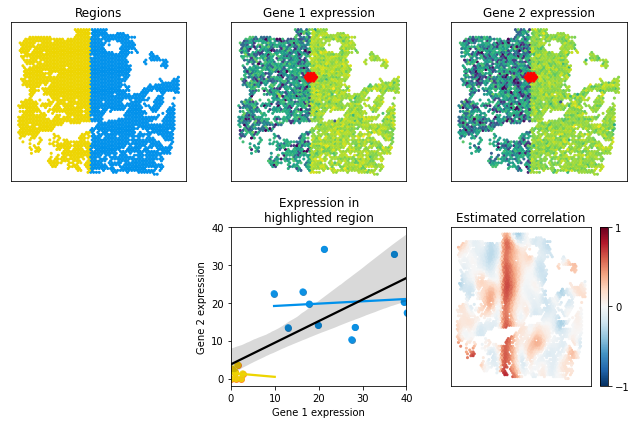

In [14]:
sns.set_palette("tab10")
toy_example_for_publication_V3(
    df_sim_data_diff_means_cs_0_0_spotwise_v2_for_fig.iloc[keep_inds], 
    row_col_to_barcode[25][61], 
    est_corrs,
    join(DATA_ROOT, 'figures/toy_example_pitfalls_no_conditioning_Visium.pdf'),
    bc_to_neighs,
    condition=False, 
    clust_key=None
)
sns.set_palette("Set2")